In [1]:
### RUN EVERY TIME: COMTRADE FACTORS VISUALIZATION

In [2]:
### RUN EVERY TIME: INITIALIZATION

import pandas as pd
import numpy as np
import gc
import os
import datetime
import time
import networkx as nx
import math
import random
import matplotlib.pyplot as plt
from matplotlib.cbook import boxplot_stats ### To annotate fliers
import seaborn as sns

In [3]:
### RUN EVERY TIME: VERSION CONTROL

from platform import python_version
print('python version: ', python_version())
print('numpy version: ', np.__version__)
print('pandas version: ', pd.__version__)

python version:  3.7.4
numpy version:  1.17.2
pandas version:  0.25.3


In [4]:
### RUN EVERY TIME: MAIN CONSTANTS

### MultiIndex level slice constant:
All = slice(None)
### Universe path:
str_path_universe = 'Data_Files/Source_Files/acadian_universe.xlsx'
### Dates:
str_date_end = '2022-12-31'
date_start = pd.Timestamp('1989-12-29')
date_end = pd.Timestamp(str_date_end)
date_ison = pd.Timestamp('1994-12-31')
### Checked EBOPS service IDs list (df_serv_to_gics['GICS Group Code']):
list_services = ['206', '210', '214', '218', '219', '223', '227', '231', '232', '237', '240', '246', '247', '250', '251', '254', '255', '256', '257', '258', '263',
                 '264', '269', '272', '273', '288', '289', '292', '293', '294', '310', '391', '431', '500', '888', '891', '892', '894', '950']
### Augmented bilateral export:
str_path_export_bilateral = 'Data_Files/Source_Files/comtrade_export_bilateral.h5'
### Export key:
str_key_unc_export = 'export_augmented'
### Augmented bilateral import:
str_path_import_bilateral = 'Data_Files/Source_Files/comtrade_import_bilateral.h5'
### Export key:
str_key_unc_import = 'import_augmented'
### Calculated factors:
str_path_simple_exp = 'Data_Files/Source_Files/comtrade_simple_exp.h5'
str_path_pagerank_exp = 'Data_Files/Source_Files/comtrade_pagerank_exp.h5'
str_path_pagerank_imp = 'Data_Files/Source_Files/comtrade_pagerank_imp.h5'
str_path_herf_full_exp = 'Data_Files/Source_Files/comtrade_herfindahl_full_exp.h5'
str_path_herf_comm_exp = 'Data_Files/Source_Files/comtrade_herfindahl_comm_exp.h5'
str_path_herf_partner_exp = 'Data_Files/Source_Files/comtrade_herfindahl_partner_exp.h5'
str_path_exclusivity_exp = 'Data_Files/Source_Files/comtrade_exclusivity_exp.h5'
str_path_quality_exp = 'Data_Files/Source_Files/comtrade_quality_exp.h5'
#str_path_compete_exp = 'Data_Files/Source_Files/comtrade_compete_exp.h5'
str_path_compete_exp = 'Data_Files/Source_Files/comtrade_compete_simple.h5'
str_key_comtrade_factor = 'comtrade_factor'
### Commodity to industry connection:
str_path_industry_map_xlsx = 'Data_Files/Source_Files/goods_to_industries_hs.xlsx'
str_page_services = 'EBOPS'
str_page_goods = 'AG2'
### NA for MS Excel files:
list_na_excel_values = ['', '#N/A', '#N/A N/A', '#NA', '-1.#IND', '-1.#QNAN', '-NaN', '-nan', '1.#IND', '1.#QNAN', 'N/A', 'NULL', 'NaN', 'n/a', 'nan', 'null',
                        '#N/A Requesting Data...', '#N/A Invalid Security', '#N/A Field Not Applicable', '---']

In [5]:
### DEFINING WEIGHTED AVERAGE CALCULATOR

def weighted_average(ser_data, ser_weight = None, int_min_count = 0):
    ### Default output:
    num_result = np.NaN
    ### Checking for data presence:
    if (ser_data.count() > int_min_count):       
        ### Checking for weights dataset:
        if ser_weight is None:
            ### Calculating of simple average:
            num_result = np.nanmean(ser_data.values)
        else:
            ### Weights filtering:
            list_weight = ser_weight[ser_data.dropna().index].values
            ### Checking for weights presence:
            if np.nansum(list_weight):
                ### Data filtering:
                list_data = ser_data.dropna().values
                ### Weighted average calculating:
                num_result = np.nansum(list_data * list_weight) / np.nansum(list_weight)
    ### Results output:
    return num_result

In [6]:
### DEFINING EXTRACTION UNIVERSE DATA FROM MS EXCEL SOURCE (TO BE IGNORED IN PRODUCT CODE)

def ison_membership_converting(str_path_universe, date_end, bool_daily = False, int_backfill_months = 0):
    ### Defining business-month-end reindexation on country level:
    def country_modify(ser_raw_country, date_end):
        ser_res_country = ser_raw_country.droplevel(0).resample('MS').last().resample('BM').last()
        range_country = pd.date_range(ser_res_country.index[0], date_end, freq = 'BM')
        return ser_res_country.reindex(range_country).ffill()
    ### Markets encoding table:
    dict_markets = {50 : 'DM', 57 : 'EM', 504 : 'FM', 0: np.NaN}     
    ### Loading source file:
    df_raw_universe = pd.read_excel(engine = 'openpyxl', io = str_path_universe, sheet_name = 'Switchers', header = 0, parse_dates = True, index_col = [0, 1],
                                 na_values = list_na_excel_values, keep_default_na = False)
    ### Converting source file:
    df_raw_universe.index.names = ['Country', 'Date']
    ser_raw_universe = df_raw_universe['Region']
    ser_raw_universe.fillna(0, inplace = True)
    ser_raw_universe.name = 'Market'
    ### By country reindexation and translation:
    ser_res_universe = ser_raw_universe.groupby('Country').apply(country_modify, date_end)
    ser_res_universe.index.names = ['Country', 'Date']
    ser_res_universe = ser_res_universe.replace(dict_markets).reorder_levels([1, 0]).sort_index() 
    ### Expanding membership for primary regions members by backfilling:
    if int_backfill_months:
        ### List of regions:
        list_region = list(ser_res_universe.dropna().unique())
        ### Initialising of collection of series with backfilled data for each region:
        list_ison_backfill = []
        ### Regions looping:
        for iter_region in list_region:
            ### Defining start of region date:
            date_first_valid = ser_res_universe.loc[ser_res_universe == iter_region].first_valid_index()[0]
            ### Creating dates index to backfilling:
            idx_date_backfill = pd.date_range(end = date_first_valid, periods = int_backfill_months + 1, freq = 'BM')[: -1]
            ### Creating primary countries index to backfilling:            
            idx_region_backfill = ser_res_universe.loc[ser_res_universe == iter_region].loc[date_first_valid, All].index.get_level_values('Country')
            ### Creating full index:
            idx_ison_backfill = pd.MultiIndex.from_product([idx_date_backfill, idx_region_backfill])
            ### Series with backfilled data:
            list_ison_backfill.append(pd.Series(iter_region, index = idx_ison_backfill))
        ### Combination of backfilled series and original ISON data:    
        ser_res_universe = ser_res_universe.combine_first(pd.concat(list_ison_backfill, axis = 0)).sort_index()  
        ser_res_universe.index.names = ['Date', 'Country']
    ### Converting to daily frequency:
    if bool_daily:
        ser_res_universe = ser_res_universe.reset_index('Country').groupby('Country').resample('B').ffill()['Market'].swaplevel().sort_index()    
    ### Results output:
    ser_res_universe.name = 'Market'
    return ser_res_universe

In [7]:
### RUN EVERY TIME: ISON DATA EXTRACTION

### ISON membership history:
ser_ison_membership = ison_membership_converting(str_path_universe, pd.to_datetime(str_date_end))
ser_ison_membership.index.names = ['Date', 'Country']
### ISON Members:
list_ison_countries = sorted(ser_ison_membership.index.get_level_values('Country').unique())
### ISON status for the last available date:
ser_ison_status = ser_ison_membership.loc[ser_ison_membership.index[-1][0]]
### ISON stats:
int_ison_number = len(sorted(ser_ison_membership.index.get_level_values(1).unique()))
dict_ison_len = {}
list_regions = ['DM', 'EM', 'FM']
dict_ison_len['ISON'] = len(ser_ison_status)
for iter_region in list_regions:
    dict_ison_len[iter_region] = len(ser_ison_status[ser_ison_status == iter_region])
ser_market_len = pd.Series(dict_ison_len)
ser_market_len.index.names = ['Market'] 

In [8]:
### LOADING COMMODITIES TO INDUSTRIES MAP

df_goods_to_ind = pd.read_excel(engine = 'openpyxl', io = str_path_industry_map_xlsx, sheet_name = str_page_goods, header = 0, dtype = 'object',
                                na_values = list_na_excel_values, keep_default_na = False).set_index('Commodity ID')
df_goods_to_ind.index.names = ['Commodity_ID']
ser_goods_to_ind = df_goods_to_ind.dropna()['GICS Industry Group'].squeeze()
ser_goods_to_ind.name = 'Industry_Group'
df_services_to_ind = pd.read_excel(engine = 'openpyxl', io = str_path_industry_map_xlsx, sheet_name = str_page_services, header = 0, dtype = 'object',
                                na_values = list_na_excel_values, keep_default_na = False).set_index('Service ID')
df_services_to_ind.index.names = ['Commodity_ID']
ser_comm_description = pd.concat([df_goods_to_ind['AG2'], df_services_to_ind.loc[list_services, 'Service Description']], axis = 0)
ser_comm_description.name = 'Description'

In [ ]:
### BILATERAL IMPORT DATA LOADING TO PERFORM FACTOR CALCULATION

gc.collect()
list_import_chunks = []
for num_iter_number, ser_iter_chunk in enumerate(pd.read_hdf(str_path_import_bilateral, key = str_key_unc_import, chunksize = 1000000)):
    gc.collect()
    print(num_iter_number, ': Extraction started')
    ser_iter_chunk = ser_iter_chunk[ser_iter_chunk > 0.0].astype('int32')
    df_iter_chunk = ser_iter_chunk.reset_index()
    df_iter_chunk = df_iter_chunk[(df_iter_chunk['Reporter'] != df_iter_chunk['Partner']) & \
                                  ((df_iter_chunk['Type'] == 'Goods') | df_iter_chunk['Commodity_ID'].isin(list_services)) & (df_iter_chunk['Reporter'] != 'World') & \
                                  (df_iter_chunk['Partner'] != 'World')]\
                               .drop('Type', axis = 1)    
    print(num_iter_number, ': Filtering performed')    
    ser_iter_chunk = df_iter_chunk.set_index(['Date', 'Reporter', 'Partner', 'Commodity_ID']).squeeze().sort_index()
    del df_iter_chunk
    gc.collect()
    list_import_chunks.append(ser_iter_chunk)
    print(num_iter_number, ': Chunk added to container')    
ser_bilateral_import = pd.concat(list_import_chunks, axis = 0, sort = False).sort_index()
ser_bilateral_import.name = 'Import'
del list_import_chunks
gc.collect()

In [ ]:
### BILATERAL EXPORT DATA LOADING TO PERFORM FACTOR CALCULATION

gc.collect()
list_export_chunks = []
for num_iter_number, ser_iter_chunk in enumerate(pd.read_hdf(str_path_export_bilateral, key = str_key_unc_export, chunksize = 1000000)):
    gc.collect()
    print(num_iter_number, ': Extraction started')
    ser_iter_chunk = ser_iter_chunk[ser_iter_chunk > 0.0].astype('int32')
    df_iter_chunk = ser_iter_chunk.reset_index()
    df_iter_chunk = df_iter_chunk[(df_iter_chunk['Reporter'] != df_iter_chunk['Partner']) & \
                                  ((df_iter_chunk['Type'] == 'Goods') | df_iter_chunk['Commodity_ID'].isin(list_services)) & (df_iter_chunk['Reporter'] != 'World') & \
                                  (df_iter_chunk['Partner'] != 'World')]\
                               .drop('Type', axis = 1)    
    print(num_iter_number, ': Filtering performed')    
    ser_iter_chunk = df_iter_chunk.set_index(['Date', 'Reporter', 'Partner', 'Commodity_ID']).squeeze().sort_index()
    del df_iter_chunk
    gc.collect()
    list_export_chunks.append(ser_iter_chunk)
    print(num_iter_number, ': Chunk added to container')    
ser_bilateral_export = pd.concat(list_export_chunks, axis = 0, sort = False).sort_index()
ser_bilateral_export.name = 'Export'
del list_export_chunks
gc.collect()

In [63]:
### TEST : 2022 DATA COVERAGE

gc.collect()
ser_test_basic = ser_bilateral_export[['1990-12-31', '1995-12-29', '2000-12-29', '2005-12-30', '2010-12-31', '2015-12-31', '2020-12-31', '2021-12-31', '2022-12-30']]
ser_bilateral_2022_07 = pd.read_hdf('Data_Files/Source_Files/comtrade_export_bilateral_2022.h5', key = str_key_unc_export)
df_test_export = ser_test_basic.unstack('Date')
df_test_export.columns = ['1990 full', '1995 full', '2000 full', '2005 full', '2010 full', '2015 full', '2020 full', '2021 full', '2022 known to 2023-05']
df_test_export['2022 known to 2023-07'] = ser_bilateral_2022_07.droplevel(['Date', 'Type'])
ser_test_export = df_test_export.stack()
ser_test_export.index.set_names('Year', level = -1, inplace = True)
ser_test_export = ser_test_export.reorder_levels([-1, 0, 1, 2]).sort_index()
print('Total Number of Flows:')
display(ser_test_export.groupby('Year').count())
print('Number of Reporters:')
display(ser_test_export.groupby(['Year']).apply(lambda ser_group: len(ser_group.droplevel(['Year', 'Partner', 'Commodity_ID']).index.drop_duplicates())))
print('Number of Commodities Reported:')
display(ser_test_export.groupby(['Year']).apply(lambda ser_group: len(ser_group.droplevel(['Year', 'Reporter', 'Partner']).index.drop_duplicates())))
print('Average Flows Number per Reporter -> Partner Pair:')
display(ser_test_export.groupby(['Year', 'Reporter', 'Partner']).count().groupby('Year').mean().round(2))
print('Number of Pairs Available:')
display(ser_test_export.groupby(['Year']).apply(lambda ser_group: len(ser_group.droplevel(['Year', 'Commodity_ID']).index.drop_duplicates())))
print('Average Number of Partners by Exporter:')
display(ser_test_export.groupby(['Year', 'Reporter']).apply(lambda ser_group: len(ser_group.droplevel(['Year', 'Commodity_ID']).index.drop_duplicates()))\
                       .groupby('Year').mean().round(2))
print('Average Number of Commodities by Exporter:')
display(ser_test_export.groupby(['Year', 'Reporter']).apply(lambda ser_group: len(ser_group.droplevel(['Year', 'Partner']).index.drop_duplicates()))\
                       .groupby('Year').mean().round(2))
df_test_results = pd.DataFrame()
df_test_results['Total Number of Commodities Reported'] = \
    ser_test_export.groupby(['Year']).apply(lambda ser_group: len(ser_group.droplevel(['Year', 'Reporter', 'Partner']).index.drop_duplicates()))
df_test_results['Number of Partners by Exporter'] = \
   ser_test_export.groupby(['Year', 'Reporter']).apply(lambda ser_group: len(ser_group.droplevel(['Year', 'Commodity_ID']).index.drop_duplicates()))\
                  .groupby('Year').mean().round(2)     
df_test_results['Number of Commodities by Exporter'] = \
   ser_test_export.groupby(['Year', 'Reporter']).apply(lambda ser_group: len(ser_group.droplevel(['Year', 'Partner']).index.drop_duplicates()))\
                  .groupby('Year').mean().round(2)                              

Total Number of Flows:


Year
1990 full                148239
1995 full                408187
2000 full                543969
2005 full                641462
2010 full                697269
2015 full                735032
2020 full                732502
2021 full                738357
2022 known to 2023-05    455073
2022 known to 2023-07    683191
dtype: int64

Number of Reporters:


Year
1990 full                179
1995 full                207
2000 full                221
2005 full                222
2010 full                223
2015 full                223
2020 full                223
2021 full                223
2022 known to 2023-05    223
2022 known to 2023-07    222
dtype: int64

Number of Commodities Reported:


Year
1990 full                 97
1995 full                 97
2000 full                127
2005 full                127
2010 full                127
2015 full                122
2020 full                122
2021 full                122
2022 known to 2023-05     97
2022 known to 2023-07     97
dtype: int64

Average Flows Number per Reporter -> Partner Pair:


Year
1990 full                24.33
1995 full                23.32
2000 full                22.82
2005 full                24.29
2010 full                24.85
2015 full                25.32
2020 full                26.11
2021 full                26.71
2022 known to 2023-05    29.09
2022 known to 2023-07    29.79
dtype: float64

Number of Pairs Available:


Year
1990 full                 6094
1995 full                17500
2000 full                23841
2005 full                26411
2010 full                28063
2015 full                29025
2020 full                28057
2021 full                27640
2022 known to 2023-05    15645
2022 known to 2023-07    22932
dtype: int64

Average Number of Partners by Exporter:


Year
1990 full                 34.04
1995 full                 84.54
2000 full                107.88
2005 full                118.97
2010 full                125.84
2015 full                130.16
2020 full                125.82
2021 full                123.95
2022 known to 2023-05     70.16
2022 known to 2023-07    103.30
dtype: float64

Average Number of Commodities by Exporter:


Year
1990 full                54.34
1995 full                75.66
2000 full                85.88
2005 full                91.23
2010 full                89.81
2015 full                90.37
2020 full                89.55
2021 full                90.88
2022 known to 2023-05    73.99
2022 known to 2023-07    78.87
dtype: float64

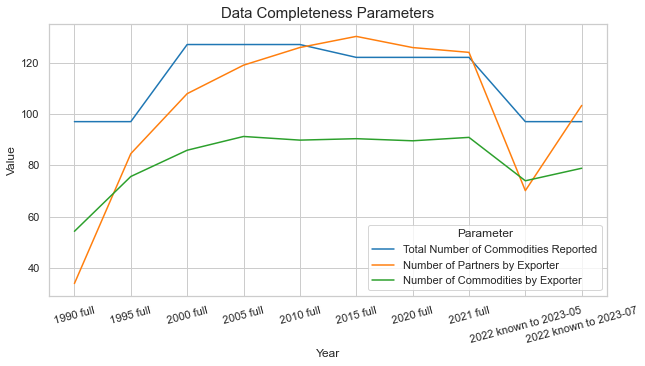

In [111]:
### TEST : 2022 DATA COVERAGE


df_test_results.columns.name = 'Parameter'
ser_to_plot = df_test_results.stack('Parameter')
ser_to_plot.name = 'Value'

sns.set_style('whitegrid')
plt.figure(figsize = (10, 5))
sns.set_context('notebook')
ax_plot = sns.lineplot(data = ser_to_plot.reset_index(), x = 'Year', y = 'Value', hue = 'Parameter')
ax_plot.set_title('Data Completeness Parameters', fontsize = 15)
plt.yticks(rotation = 0)
plt.xticks(rotation = 15)
plt.show()     

In [30]:
### REPORTER / COMMODITY BY DATE WEIGHTS

gc.collect()
### Export totals:
ser_country_comm_export = ser_bilateral_export.groupby(['Date', 'Reporter', 'Commodity_ID']).sum().dropna()
ser_country_comm_export.name = 'Export'
### Weights calculation:
ser_export_weight = ser_country_comm_export.groupby(['Date', 'Commodity_ID']).transform(lambda ser_group: ser_group / ser_group.sum())
ser_export_weight.name = 'Weight_Local'
#ser_export_weight = ser_export_weight.reorder_levels([2, 0, 1]).sort_index()
#ser_export_weight = ser_export_weight.dropna()

In [ ]:
### FACTORS LOADING

dict_factors = {}
dict_factors['Simple_Export'] = pd.read_hdf(str_path_simple_exp, str_key_comtrade_factor)['Weight_Local'].swaplevel()
dict_factors['Pagerank_Export'] = pd.read_hdf(str_path_pagerank_exp, str_key_comtrade_factor)['PG_Rank_Local'].swaplevel()
dict_factors['Pagerank_Import'] = pd.read_hdf(str_path_pagerank_imp, str_key_comtrade_factor)['PG_Rank_Local'].swaplevel()
dict_factors['Herfindahl_Flow'] = pd.read_hdf(str_path_herf_full_exp, str_key_comtrade_factor)
#dict_factors['Herfindahl_Commodity'] = pd.read_hdf(str_path_herf_comm_exp, str_key_comtrade_factor)
dict_factors['Herfindahl_Partner'] = pd.read_hdf(str_path_herf_partner_exp, str_key_comtrade_factor)
dict_factors['Exclusivity_Export'] = pd.read_hdf(str_path_exclusivity_exp, str_key_comtrade_factor)
#dict_factors['Quality_Export'] = pd.read_hdf(str_path_quality_exp, str_key_comtrade_factor)['Product_Lvl_W']
#dict_factors['Compete_M'] = pd.read_hdf(str_path_compete_exp, str_key_comtrade_factor)['Compete_M']
#dict_factors['Compete_W'] = pd.read_hdf(str_path_compete_exp, str_key_comtrade_factor)['Compete_W']

df_factors = pd.concat(dict_factors, axis = 1).loc[pd.date_range(date_start, date_end, freq = 'BY')]
df_factors.index.names = ['Date', 'Country']
df_factors = df_factors.join(ser_ison_status).set_index('Market', append = True)

dict_names = {'Simple_Export': 'Weighted Export', 'Pagerank_Export': 'PageRank by Export Flows', 'Pagerank_Import': 'PageRank by Import Flows', 
              'Herfindahl_Commodity': 'Herfindahl Index by Commodities', 'Herfindahl_Partner': 'Herfindahl Index by Partners', 
              'Exclusivity_Export': 'Exclusivity of Export', 'Quality_Export': 'Quality of Export Items',
              'Compete_M': 'Competetiveness of Export Items within Market', 'Compete_W': 'Competetiveness of Export Items (Global)'}

In [ ]:
### FACTORS DESCRIPTION

gc.collect()
### Factor to compare:
ser_simple_exp = df_factors['Simple_Export']

#for iter_factor in ['Simple_Export', 'Pagerank_Export', 'Exclusivity_Export', 'Quality_Export', 'Herfindahl_Commodity', 'Herfindahl_Commodity', 'Compete_M']:
for iter_factor in ['Exclusivity_Export']:
    str_iter_name = dict_names[iter_factor]
    ### Factor selecting:
    ser_iter_factor = df_factors[iter_factor]
    ser_iter_factor.name = 'Factor'
    ### Calculating of coverage:
    ser_iter_count = ser_iter_factor.groupby(['Date', 'Market']).count()
    ser_iter_ison = pd.concat({'ISON': ser_iter_count.groupby('Date').sum()}, names = ['Market']).swaplevel()
    ser_iter_count = pd.concat([ser_iter_count, ser_iter_ison], axis = 0).sort_index()
    ser_iter_part = ((ser_iter_count / ser_market_len).round(2) * 100).astype(int)
    ser_iter_part.name = 'Percentage'
    ### Coverage plotting:
    df_to_plot = ser_iter_part.reset_index()
    df_to_plot['Year'] = df_to_plot['Date'].dt.year
    sns.set_style('whitegrid')
    plt.figure(figsize = (10, 5))
    sns.set_context('notebook')
    ax_coverage = sns.lineplot(data = df_to_plot, x = 'Year', y = 'Percentage', hue = 'Market')
    ax_coverage.set_title(str_iter_name + ' : Part of actual ISON region members presented', fontsize = 15)
    ax_coverage.set(ylim = (0, 105), ylabel = 'Percent')
    plt.show()       
    ### Calculating of mean:
    ser_iter_mean = ser_iter_factor.groupby(['Date', 'Market']).mean()
    ser_iter_ison = pd.concat({'ISON': ser_iter_mean.groupby('Date').mean()}, names = ['Market']).swaplevel()
    ser_iter_mean = pd.concat([ser_iter_mean, ser_iter_ison], axis = 0).sort_index()
    ser_iter_mean.name = 'Mean'
    ### Mean plotting:
    df_to_plot = ser_iter_mean.reset_index()
    df_to_plot['Year'] = df_to_plot['Date'].dt.year
    sns.set_style('whitegrid')
    plt.figure(figsize = (10, 5))
    sns.set_context('notebook')
    ax_coverage = sns.lineplot(data = df_to_plot, x = 'Year', y = 'Mean', hue = 'Market')
    ax_coverage.set_title(str_iter_name + ' : by Region Mean Factor Value', fontsize = 15)
    plt.show()      
    ### Distribution plotting:
    df_to_plot = ser_iter_factor.groupby(['Country', 'Market']).last().dropna().reset_index()
    sns.set_style('whitegrid')
    plt.figure(figsize = (10, 5))
    sns.set_context('notebook')
    ax_box = sns.boxplot(data = df_to_plot, x = 'Factor', y = 'Market', order = list_regions)
    ### Fliers annotation:
    for iter_num, iter_region in enumerate(list_regions):
        list_fliers = boxplot_stats(df_to_plot[df_to_plot['Market'] == iter_region].drop(['Country', 'Market'], axis = 1))[0]['fliers']
        int_angle = 60
        flo_shift = -0.05
        for iter_flier in sorted(list_fliers):
            str_iter_country = df_to_plot.loc[(df_to_plot['Market'] == iter_region) & (df_to_plot['Factor'] == iter_flier), 'Country'].values[0]
            ax_box.text(s = str_iter_country, x = iter_flier, y = iter_num + flo_shift, rotation = int_angle)            
            if (int_angle == 60):
                flo_shift = 0.2
            else:
                flo_shift = -0.05
            int_angle = -int_angle
    ### Title adding:
    ax_box.set_title(str_iter_name + ' : Distribution of Regional Values' + '\n' + '(last available observation for each country)', fontsize = 15)
    plt.show()    
    ### Largest / smallest values preparation:
    int_n_countries = 5
    int_n_years = 10
    ser_iter_mean = ser_iter_factor.loc[ser_iter_factor.index.levels[0][-int_n_years : ]].groupby('Country').mean().dropna().sort_values(ascending = False)
    ### Leaders data preparation:
    df_iter_largest = ser_iter_factor.loc[All, ser_iter_mean[: int_n_countries].index, All].droplevel('Market').reset_index()
    df_iter_largest['Year'] = df_iter_largest['Date'].dt.year
    df_iter_largest = df_iter_largest.drop('Date', axis = 1).set_index(['Country', 'Year']).unstack('Year').sort_index()
    ### Outsiders data preparation:
    df_iter_smallest = ser_iter_factor.loc[All, ser_iter_mean[-int_n_countries :].index, All].droplevel('Market').reset_index()
    df_iter_smallest['Year'] = df_iter_smallest['Date'].dt.year
    df_iter_smallest = df_iter_smallest.drop('Date', axis = 1).set_index(['Country', 'Year']).unstack('Year').sort_index()
    ### Median timeseries:
    ser_iter_median = ser_iter_factor.groupby('Date').median()
    df_iter_median = pd.concat({'Median': ser_iter_median}, names = ['Country']).swaplevel().reset_index()
    df_iter_median['Year'] = df_iter_median['Date'].dt.year
    df_iter_median = df_iter_median.drop('Date', axis = 1).set_index(['Country', 'Year']).unstack('Year').sort_index()
    ### Data aggregation:
    df_to_plot = pd.concat([df_iter_largest, df_iter_median, df_iter_smallest], axis = 0)
    df_to_plot.columns = df_to_plot.columns.droplevel(0)
    int_digits = -math.ceil(-np.log10(df_to_plot.max().max()))    
    df_to_plot = (df_to_plot / (10 ** int_digits))    
    ### Heatmap plotting:
    plt.figure(figsize = (15, 7))
    ax_heatmap = sns.heatmap(df_to_plot, cmap = 'YlGnBu', xticklabels = True, yticklabels = True, cbar = True, linewidth = 0.5, square = False,
                             annot = True, fmt = '0.1f')
    ax_heatmap.set_title(str_iter_name + ' : Last ' + str(int_n_years) + ' Years Top-' + str(int_n_countries) + ' & Bottom-' + str(int_n_countries) + ' Countries' + 
                         '\n' + '(values are divided by 10 ^ ' + str(int_digits) + ' to illustrate data)' , fontsize = 15)
#    ax_heatmap = sns.heatmap(df_to_plot * 100, cmap = 'YlGnBu', xticklabels = True, yticklabels = True, cbar = True, linewidth = 0.5, square = False,
#                             annot = True, fmt = '0.0f')    
#    ax_heatmap.set_title(str_iter_name + ' : Last ' + str(int_n_years) + ' Years Top-' + str(int_n_countries) + ' & Bottom-' + str(int_n_countries) + ' Countries' + 
#                         '\n' + '(values are divided by 10 ^ ' + '-2' + ' to illustrate data)' , fontsize = 15)
    plt.yticks(rotation = 0)
    plt.show()         
#    break

In [11]:
### REPORTER / COMMODITY BY DATE PAGE RANK

gc.collect()
def get_pagerank(df_group):
    nx_graph = nx.from_pandas_edgelist(df_group, 'Reporter', 'Partner', edge_attr = 'Export', create_using = nx.DiGraph)
    dict_pagerank = nx.pagerank(nx_graph)
    ser_pagerank = pd.Series(dict_pagerank)
    return ser_pagerank
ser_export_pagerank = ser_bilateral_export.reset_index().groupby(['Date', 'Commodity_ID']).apply(get_pagerank)
ser_export_pagerank.name = 'PG_Rank_Local'
ser_export_pagerank.index.names = ['Date', 'Commodity_ID', 'Reporter']
ser_export_pagerank = ser_export_pagerank.reorder_levels(['Date', 'Reporter', 'Commodity_ID']).sort_index()

In [13]:
### TEMP

(ser_country_comm_export['2020-12-31', 'ZM'] / ser_country_comm_export['2020-12-31', 'ZM'].sum()).nlargest(10).to_excel('Data_Files/Test_Files/Commodoties_ZM.xlsx')

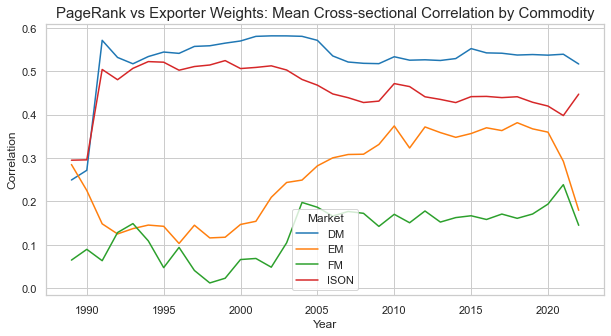

In [14]:
### TEST: SIMPLE WEIGHTS VS PAGERANKS

gc.collect()
df_to_compare = pd.concat([ser_export_pagerank.loc[:, ser_ison_status.index], ser_export_weight.loc[:, ser_ison_status.index]], axis = 1)
### Adding regions:
ser_ison_status.index.name = 'Reporter'
df_to_compare = df_to_compare.join(ser_ison_status).set_index('Market', append = True)
ser_ison_status.index.name = 'Country'
### Cross-sectional correlations (mean of by-commodity correlations):
ser_corr_region = df_to_compare.groupby(['Date', 'Commodity_ID', 'Market']).corr().loc[(All, All, All, 'PG_Rank_Local'), 'Weight_Local'].droplevel(-1)\
                               .groupby(['Date', 'Market']).mean()

ser_corr_ison = df_to_compare.groupby(['Date', 'Commodity_ID']).corr().loc[(All, All, 'PG_Rank_Local'), 'Weight_Local'].droplevel(-1).groupby(['Date', ]).mean()
ser_corr_ison = pd.concat({'ISON': ser_corr_ison}, names = ['Market']).swaplevel()
ser_corr_region = pd.concat([ser_corr_region, ser_corr_ison], axis = 0).sort_index()
ser_corr_region.name = 'Correlation'
### Correlations plotting:
df_to_plot = ser_corr_region.reset_index()
df_to_plot['Year'] = df_to_plot['Date'].dt.year
sns.set_style('whitegrid')
plt.figure(figsize = (10, 5))
sns.set_context('notebook')
ax_coverage = sns.lineplot(data = df_to_plot, x = 'Year', y = 'Correlation', hue = 'Market')
ax_coverage.set_title('PageRank vs Exporter Weights: Mean Cross-sectional Correlation by Commodity', fontsize = 15)
plt.show() 

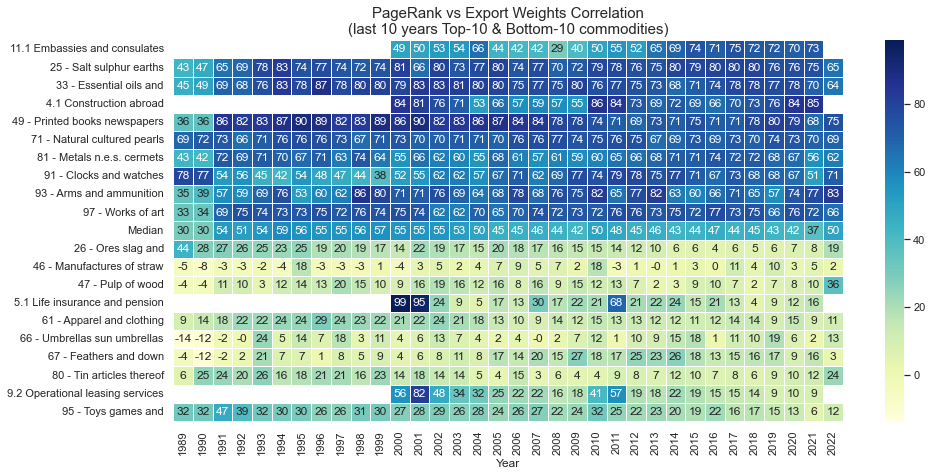

In [15]:
### TEST: SIMPLE WEIGHTS VS PAGERANKS

gc.collect()

df_to_compare = pd.concat([ser_export_pagerank.loc[:, ser_ison_status.index], ser_export_weight.loc[:, ser_ison_status.index]], axis = 1)
### Cross-sectional correlations (mean of by-commodity correlations):
ser_corr_ison = df_to_compare.groupby(['Date', 'Commodity_ID']).corr().loc[(All, All, 'PG_Rank_Local'), 'Weight_Local'].droplevel(-1)
### Largest / smallest values preparation:
int_n_commodities = 10
int_n_years = 10
### Leaders Visualization:
ser_corr_mean = ser_corr_ison.loc[ser_corr_ison.index.levels[0][-int_n_years : ]].groupby('Commodity_ID').mean().dropna().sort_values(ascending = False)
### Leaders data preparation:
df_corr_largest = ser_corr_ison.loc[All, ser_corr_mean[: int_n_commodities].index, All].reset_index()
df_corr_largest['Year'] = df_corr_largest['Date'].dt.year
df_corr_largest['Commodity_Name'] = df_corr_largest['Commodity_ID'].replace(ser_comm_description).str.replace(';', '').str.replace(',', '')
df_corr_largest['Commodity_Name'] = df_corr_largest['Commodity_Name'].str.split(' ').str[: 5].str.join(' ')
df_corr_largest = df_corr_largest.drop(['Date', 'Commodity_ID'], axis = 1).set_index(['Commodity_Name', 'Year']).unstack('Year').sort_index()
### Outsiders data preparation:
df_corr_smallest = ser_corr_ison.loc[All, ser_corr_mean[-int_n_commodities :].index, All].reset_index()
df_corr_smallest['Year'] = df_corr_smallest['Date'].dt.year
df_corr_smallest['Commodity_Name'] = df_corr_smallest['Commodity_ID'].replace(ser_comm_description).str.replace(';', '').str.replace(',', '')
df_corr_smallest['Commodity_Name'] = df_corr_smallest['Commodity_Name'].str.split(' ').str[: 5].str.join(' ')
df_corr_smallest = df_corr_smallest.drop(['Date', 'Commodity_ID'], axis = 1).set_index(['Commodity_Name', 'Year']).unstack('Year').sort_index()
### Median timeseries:
ser_corr_median = ser_corr_ison.groupby('Date').median()
df_corr_median = pd.concat({'Median': ser_corr_median}, names = ['Commodity_ID']).swaplevel().reset_index()
df_corr_median['Year'] = df_corr_median['Date'].dt.year
df_corr_median = df_corr_median.drop('Date', axis = 1).set_index(['Commodity_ID', 'Year']).unstack('Year').sort_index()  
### Data aggregation:
df_to_plot = pd.concat([df_corr_largest, df_corr_median, df_corr_smallest], axis = 0)
df_to_plot.columns = df_to_plot.columns.droplevel(0)
df_to_plot = df_to_plot * 100
### Heatmap plotting:
plt.figure(figsize = (15, 7))
ax_heatmap = sns.heatmap(df_to_plot, cmap = 'YlGnBu', xticklabels = True, yticklabels = True, cbar = True, linewidth = 0.5, square = False,
                         annot = True, fmt = '0.0f')
ax_heatmap.set_title('PageRank vs Export Weights Correlation' + '\n' + '(last ' + str(int_n_years) + ' years Top-' + \
                     str(int_n_commodities) + ' & Bottom-' + str(int_n_commodities) + ' commodities)' , fontsize = 15)
plt.yticks(rotation = 0)
plt.show() 

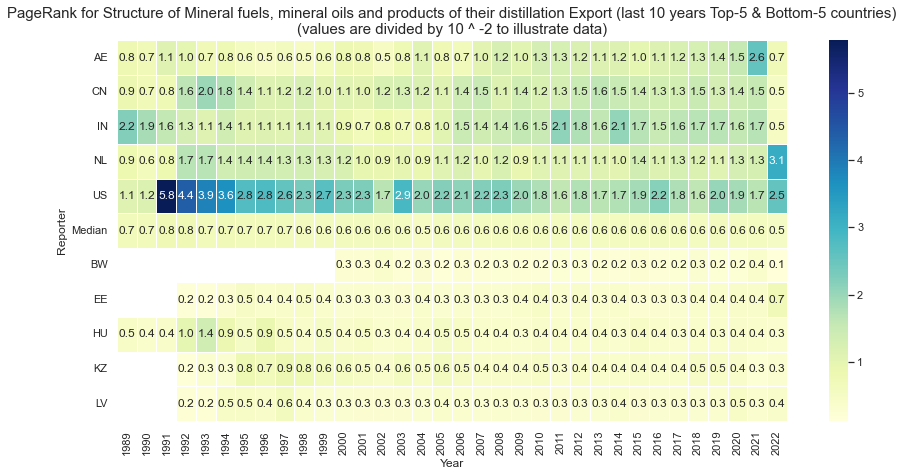

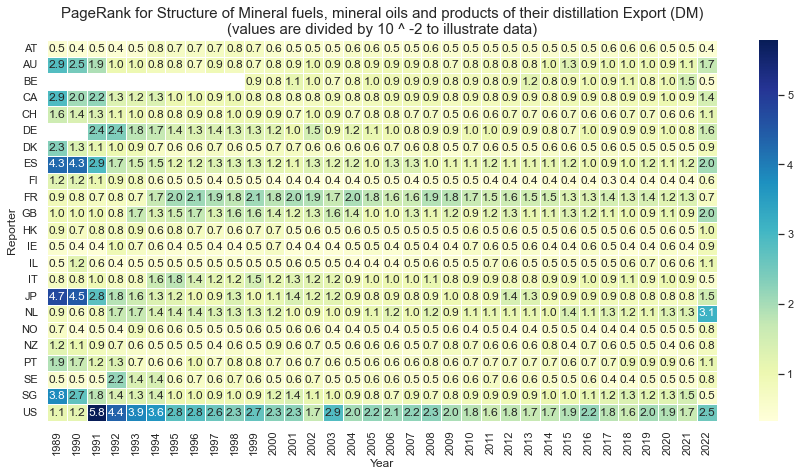

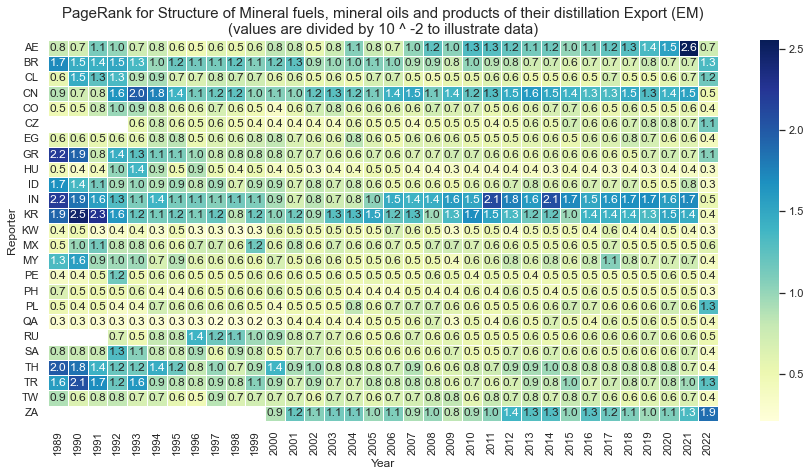

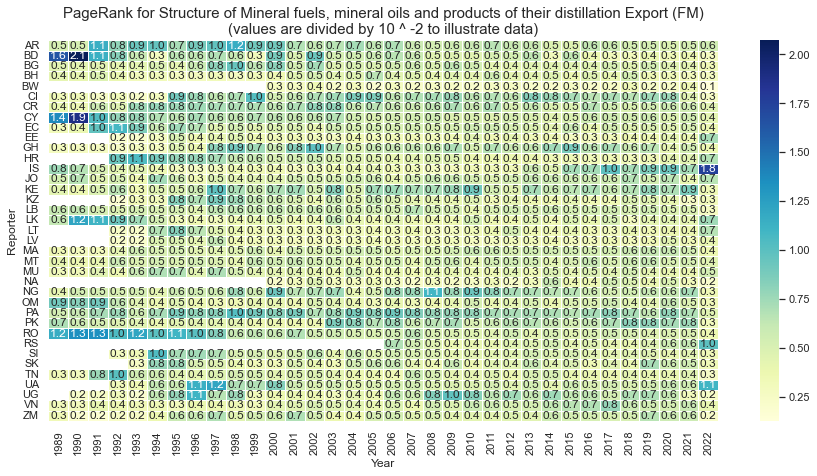

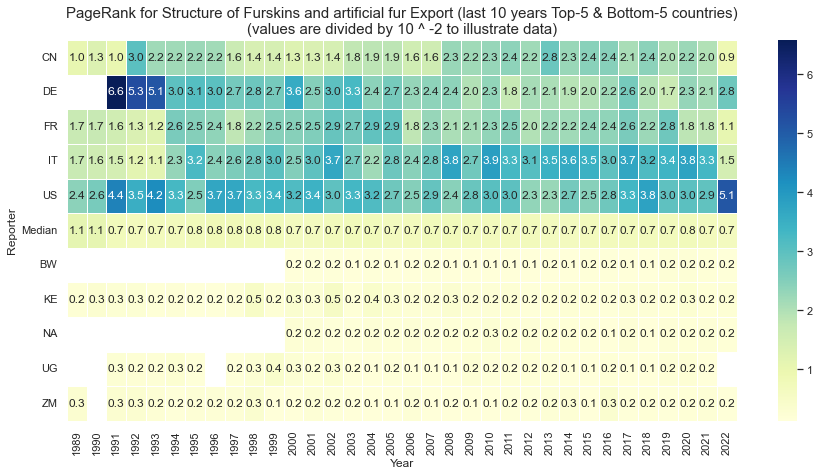

...

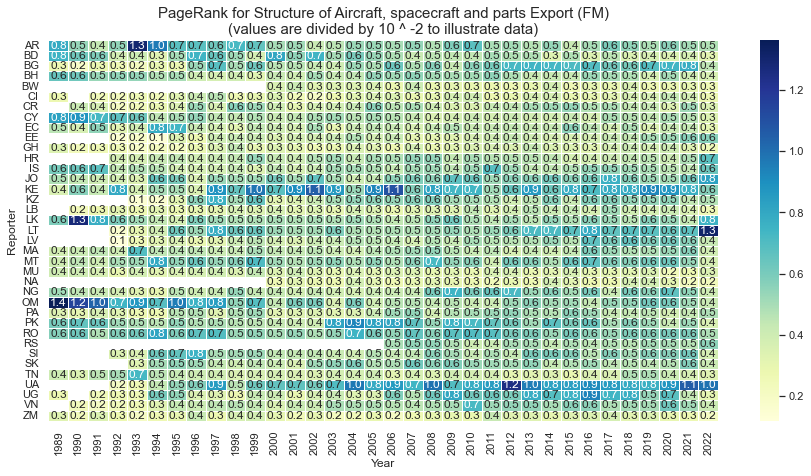

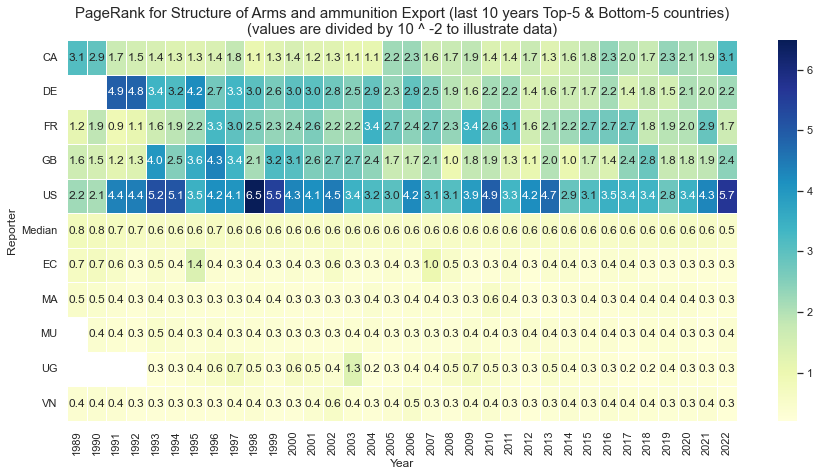

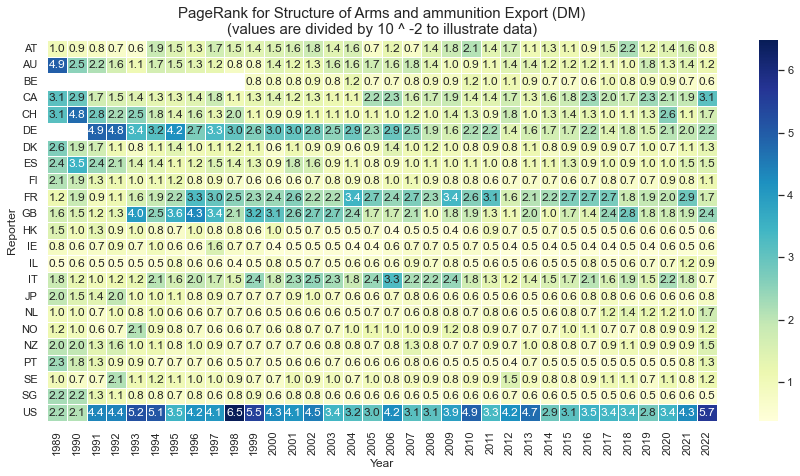

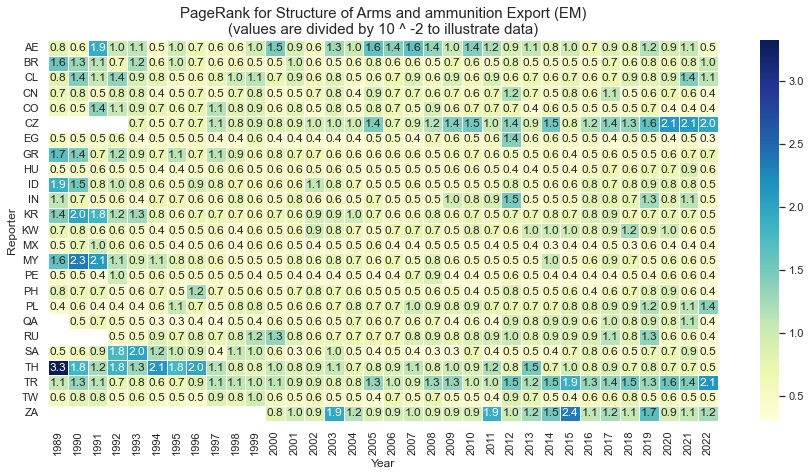

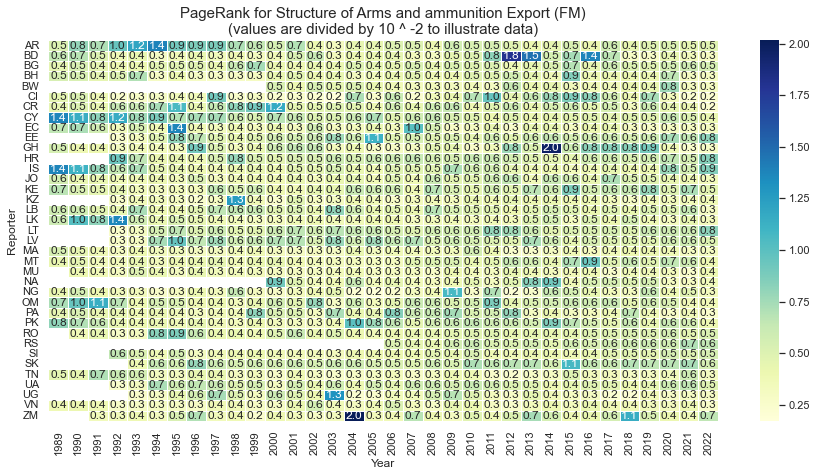

In [16]:
### PAGERANK BY COMMODITY HEATMAP

gc.collect()

dict_commodities = {}
dict_commodities['27'] = 'Mineral fuels, mineral oils and products of their distillation'
dict_commodities['43'] = 'Furskins and artificial fur'
dict_commodities['72'] = 'Iron and steel'
dict_commodities['84'] = 'Nuclear reactors, boilers, machinery and mechanical appliances'
dict_commodities['87'] = 'Vehicles, other than railway or tramway rolling stock'
dict_commodities['88'] = 'Aircraft, spacecraft and parts'
dict_commodities['93'] = 'Arms and ammunition'

ser_ison_status.index.name = 'Reporter'
for iter_commodity in dict_commodities:
#for iter_commodity in ['93']:    
    ser_iter_pagerank = ser_export_pagerank.loc[:, ser_ison_status.index, iter_commodity].droplevel('Commodity_ID')\
                                           .to_frame().join(ser_ison_status).set_index('Market', append = True).squeeze()
    ### Leaders Visualization:
    int_n_countries = 5
    int_n_years = 10
    ser_iter_mean = ser_iter_pagerank.loc[ser_iter_pagerank.index.levels[0][-int_n_years : ]].groupby('Reporter').mean().dropna().sort_values(ascending = False)
    ### Leaders data preparation:
    df_iter_largest = ser_iter_pagerank.loc[All, ser_iter_mean[: int_n_countries].index, All].droplevel('Market').reset_index()
    df_iter_largest['Year'] = df_iter_largest['Date'].dt.year
    df_iter_largest = df_iter_largest.drop('Date', axis = 1).set_index(['Reporter', 'Year']).unstack('Year').sort_index()
    ### Outsiders data preparation:
    df_iter_smallest = ser_iter_pagerank.loc[All, ser_iter_mean[-int_n_countries :].index, All].droplevel('Market').reset_index()
    df_iter_smallest['Year'] = df_iter_smallest['Date'].dt.year
    df_iter_smallest = df_iter_smallest.drop('Date', axis = 1).set_index(['Reporter', 'Year']).unstack('Year').sort_index()
    ### Median timeseries:
    ser_iter_median = ser_iter_pagerank.groupby('Date').median()
    df_iter_median = pd.concat({'Median': ser_iter_median}, names = ['Reporter']).swaplevel().reset_index()
    df_iter_median['Year'] = df_iter_median['Date'].dt.year
    df_iter_median = df_iter_median.drop('Date', axis = 1).set_index(['Reporter', 'Year']).unstack('Year').sort_index()    
    ### Data aggregation:
    df_to_plot = pd.concat([df_iter_largest, df_iter_median, df_iter_smallest], axis = 0)
    df_to_plot.columns = df_to_plot.columns.droplevel(0)
    int_digits = -math.ceil(-np.log10(df_to_plot.max().max()))    
    df_to_plot = (df_to_plot / (10 ** int_digits))    
    ### Heatmap plotting:
    plt.figure(figsize = (15, 7))
    ax_heatmap = sns.heatmap(df_to_plot, cmap = 'YlGnBu', xticklabels = True, yticklabels = True, cbar = True, linewidth = 0.5, square = False,
                             annot = True, fmt = '0.1f')
    ax_heatmap.set_title('PageRank for Structure of ' + dict_commodities[iter_commodity] + ' Export (last ' + str(int_n_years) + ' years Top-' + \
                         str(int_n_countries) + ' & Bottom-' + str(int_n_countries) + ' countries' + ')' + \
                         '\n' + '(values are divided by 10 ^ ' + str(int_digits) + ' to illustrate data)' , fontsize = 15)
    plt.yticks(rotation = 0)
    plt.show()           
    ### By Region Visualization:
    for iter_region in list_regions:
        df_iter_comm = ser_iter_pagerank.loc[:, :, [iter_region]].droplevel(['Market']).reset_index()
        df_iter_comm['Year'] = df_iter_comm['Date'].dt.year
        ser_iter_comm = df_iter_comm.drop('Date', axis = 1).set_index(['Reporter', 'Year']).squeeze()
        df_to_plot = ser_iter_comm.unstack('Year')
        int_digits = -math.ceil(-np.log10(df_to_plot.max().max()))    
        df_to_plot = (df_to_plot / (10 ** int_digits))    
        ### Heatmap plotting:
        plt.figure(figsize = (15, 7))
        ax_heatmap = sns.heatmap(df_to_plot, cmap = 'YlGnBu', xticklabels = True, yticklabels = True, cbar = True, linewidth = 0.5, square = False,
                                 annot = True, fmt = '0.1f')
        ax_heatmap.set_title('PageRank for Structure of ' + dict_commodities[iter_commodity] + ' Export (' + iter_region + ')'
                             '\n' + '(values are divided by 10 ^ ' + str(int_digits) + ' to illustrate data)' , fontsize = 15)
        plt.yticks(rotation = 0)
        plt.show()     
#        break
#    break
ser_ison_status.index.name = 'Country'

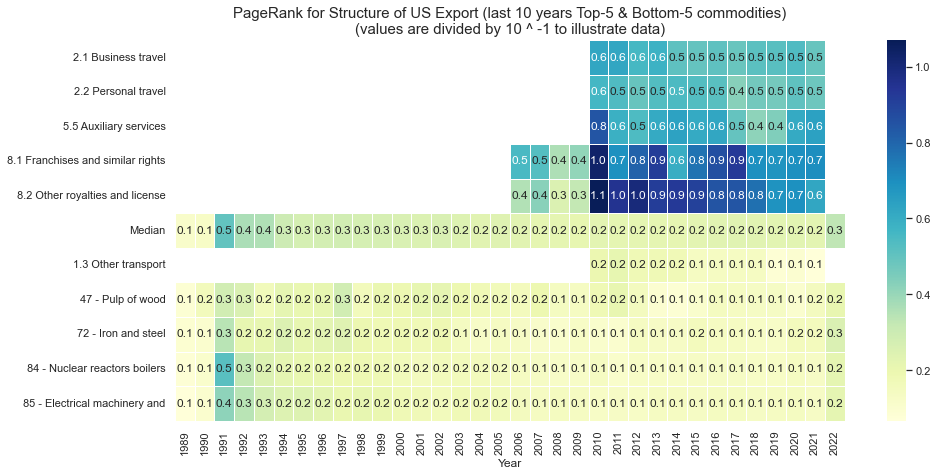

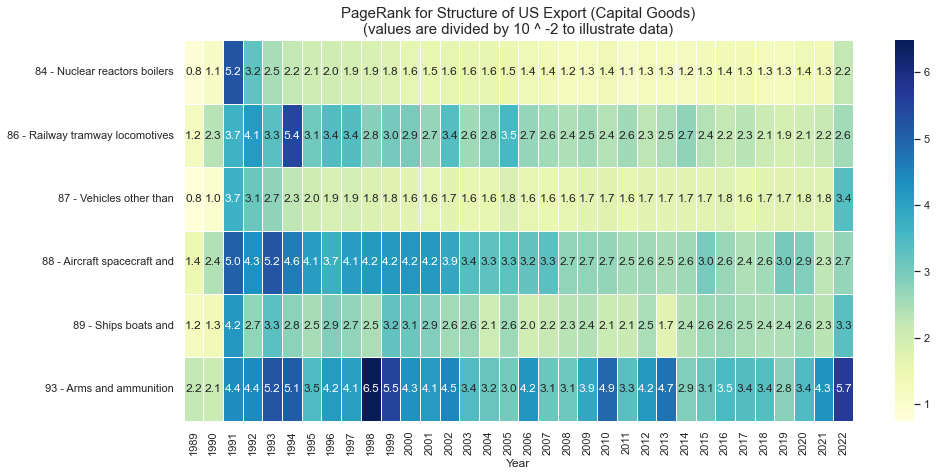

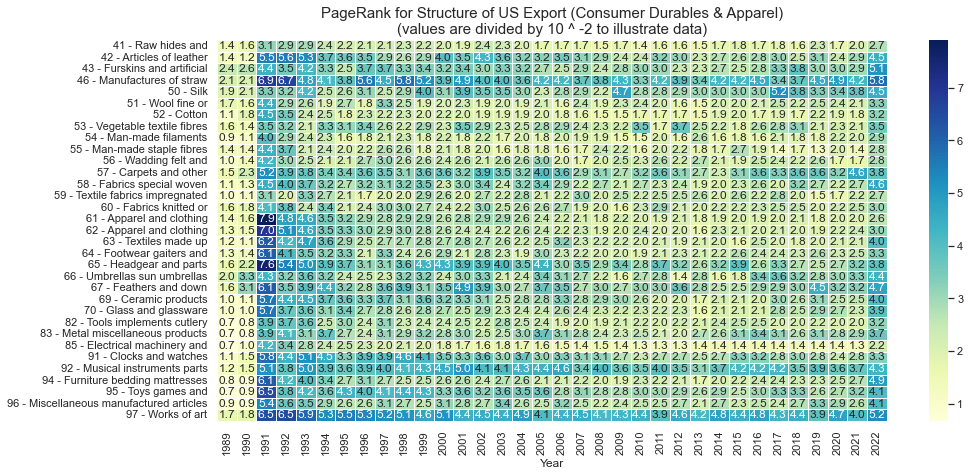

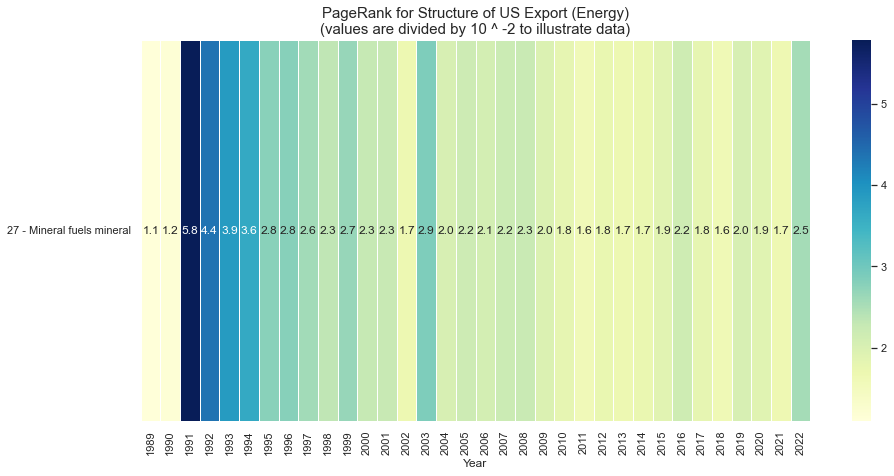

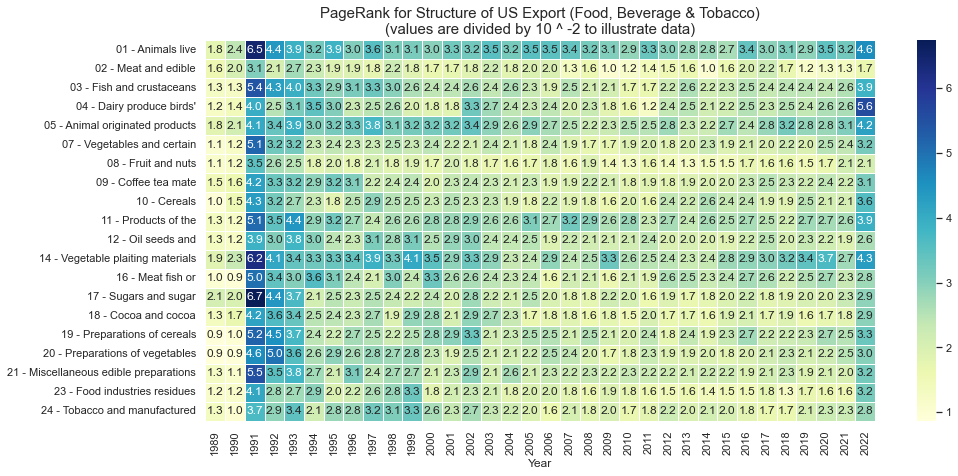

...

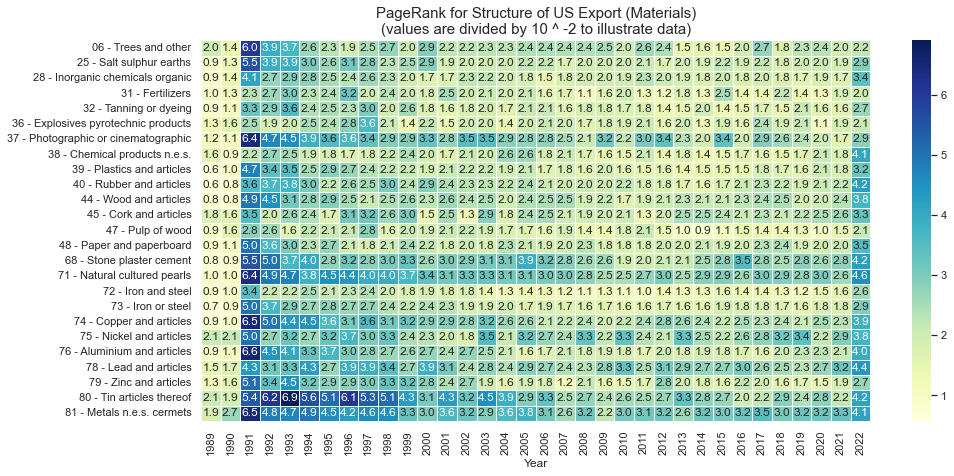

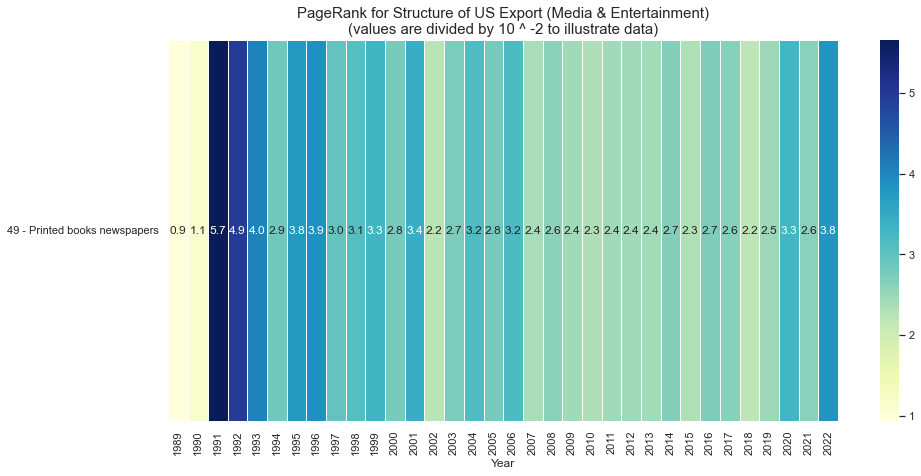

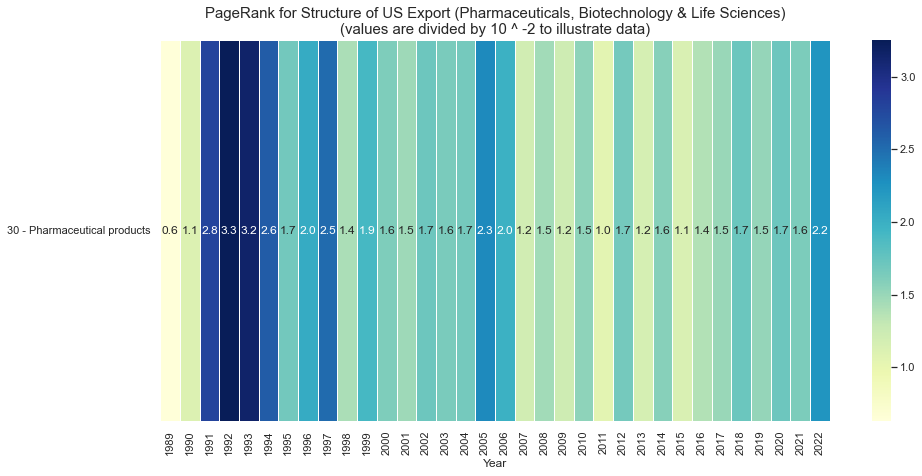

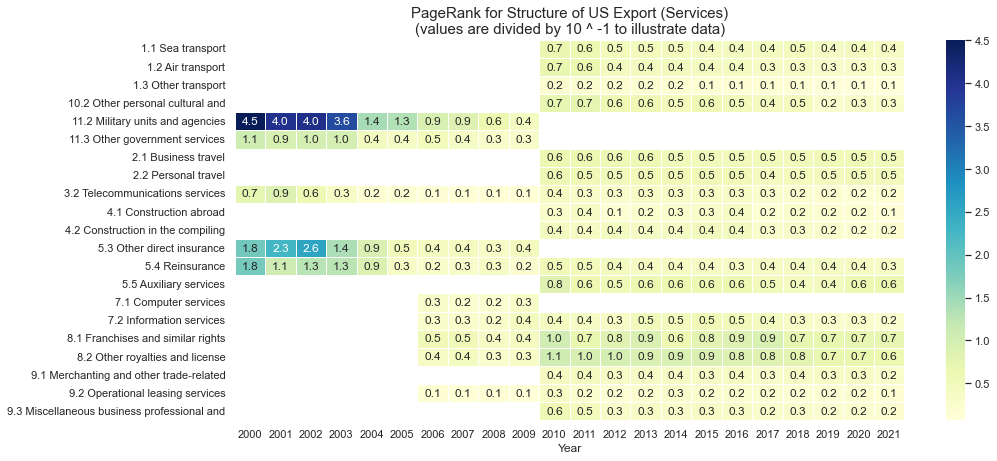

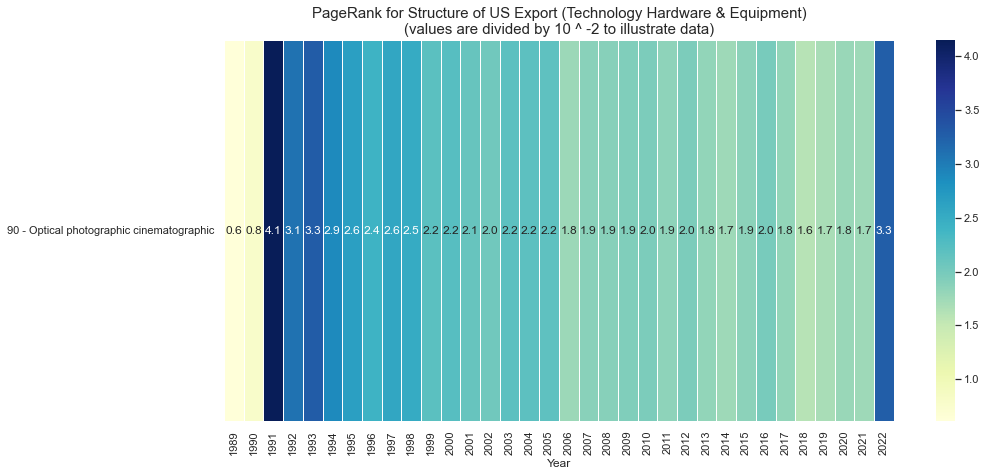

In [17]:
### PAGERANK BY COUNTRY HEATMAP

gc.collect()

list_countries = ['CN', 'GB', 'JP', 'RU', 'US']
### Largest / smallest values preparation:
int_n_commodities = 5
int_n_years = 10

### Commodities separation:
list_commodities = ser_export_pagerank.index.levels[-1].to_list()
ser_comm_to_ind = ser_goods_to_ind.append(pd.Series('Services', [iter_id for iter_id in list_commodities if (len(iter_id) == 3)]))
ser_comm_to_ind.name = 'Industry_Group'
ser_comm_to_ind.index.names = ['Commodity_ID']
list_ind_groups = sorted(set(ser_comm_to_ind.to_list()))

ser_ison_status.index.name = 'Reporter'
#for iter_country in list_countries:
for iter_country in ['US']:    
    ser_iter_pagerank = ser_export_pagerank.loc[:, [iter_country], :].droplevel('Reporter')
    ser_iter_pagerank = ser_iter_pagerank.to_frame().join(ser_comm_to_ind).set_index('Industry_Group', append = True).squeeze()
    ### Leaders Visualization:
    ser_iter_mean = ser_iter_pagerank.loc[ser_iter_pagerank.index.levels[0][-int_n_years : ]].groupby('Commodity_ID').mean().dropna().sort_values(ascending = False)
    ### Leaders data preparation:
    df_iter_largest = ser_iter_pagerank.loc[All, ser_iter_mean[: int_n_commodities].index, All].droplevel('Industry_Group').reset_index()
    df_iter_largest['Year'] = df_iter_largest['Date'].dt.year
#    df_iter_largest = df_iter_largest.drop('Date', axis = 1).set_index(['Commodity_ID', 'Year']).unstack('Year').sort_index()
    df_iter_largest['Commodity_Name'] = df_iter_largest['Commodity_ID'].replace(ser_comm_description).str.replace(';', '').str.replace(',', '')
    df_iter_largest['Commodity_Name'] = df_iter_largest['Commodity_Name'].str.split(' ').str[: 5].str.join(' ')
    df_iter_largest = df_iter_largest.drop(['Date', 'Commodity_ID'], axis = 1).set_index(['Commodity_Name', 'Year']).unstack('Year').sort_index()
    ### Outsiders data preparation:
    df_iter_smallest = ser_iter_pagerank.loc[All, ser_iter_mean[-int_n_commodities :].index, All].droplevel('Industry_Group').reset_index()
    df_iter_smallest['Year'] = df_iter_smallest['Date'].dt.year
#    df_iter_smallest = df_iter_smallest.drop('Date', axis = 1).set_index(['Commodity_ID', 'Year']).unstack('Year').sort_index()
    df_iter_smallest['Commodity_Name'] = df_iter_smallest['Commodity_ID'].replace(ser_comm_description).str.replace(';', '').str.replace(',', '')
    df_iter_smallest['Commodity_Name'] = df_iter_smallest['Commodity_Name'].str.split(' ').str[: 5].str.join(' ')
    df_iter_smallest = df_iter_smallest.drop(['Date', 'Commodity_ID'], axis = 1).set_index(['Commodity_Name', 'Year']).unstack('Year').sort_index()
    ### Median timeseries:
    ser_iter_median = ser_iter_pagerank.groupby('Date').median()
    df_iter_median = pd.concat({'Median': ser_iter_median}, names = ['Commodity_ID']).swaplevel().reset_index()
    df_iter_median['Year'] = df_iter_median['Date'].dt.year
    df_iter_median = df_iter_median.drop('Date', axis = 1).set_index(['Commodity_ID', 'Year']).unstack('Year').sort_index()    
    ### Data aggregation:
    df_to_plot = pd.concat([df_iter_largest, df_iter_median, df_iter_smallest], axis = 0)
    df_to_plot.columns = df_to_plot.columns.droplevel(0)     
    int_digits = -math.ceil(-np.log10(df_to_plot.max().max()))    
    df_to_plot = (df_to_plot / (10 ** int_digits))    
    ### Heatmap plotting:
    plt.figure(figsize = (15, 7))
    ax_heatmap = sns.heatmap(df_to_plot, cmap = 'YlGnBu', xticklabels = True, yticklabels = True, cbar = True, linewidth = 0.5, square = False,
                             annot = True, fmt = '0.1f')
    ax_heatmap.set_title('PageRank for Structure of ' + iter_country + ' Export (last ' + str(int_n_years) + ' years Top-' + \
                         str(int_n_commodities) + ' & Bottom-' + str(int_n_commodities) + ' commodities)' + \
                         '\n' + '(values are divided by 10 ^ ' + str(int_digits) + ' to illustrate data)' , fontsize = 15)
    plt.yticks(rotation = 0)
    plt.show()         
    ### By Industry Group Visualization:
    for iter_type in list_ind_groups:
        df_iter_comm = ser_iter_pagerank.loc[:, :, [iter_type]].droplevel('Industry_Group').reset_index()
        if (len(df_iter_comm) > 0) :
            df_iter_comm['Year'] = df_iter_comm['Date'].dt.year
#            ser_iter_comm = df_iter_comm.drop('Date', axis = 1).set_index(['Commodity_ID', 'Year']).squeeze()            
            df_iter_comm['Commodity_Name'] = df_iter_comm['Commodity_ID'].replace(ser_comm_description).str.replace(';', '').str.replace(',', '')
            df_iter_comm['Commodity_Name'] = df_iter_comm['Commodity_Name'].str.split(' ').str[: 5].str.join(' ')
            ser_iter_comm = df_iter_comm.drop(['Date', 'Commodity_ID'], axis = 1).set_index(['Commodity_Name', 'Year']).squeeze()
            df_to_plot = ser_iter_comm.unstack('Year')
            df_to_plot.index.name = ''
            int_digits = -math.ceil(-np.log10(df_to_plot.max().max()))    
            df_to_plot = (df_to_plot / (10 ** int_digits))    
            ### Heatmap plotting:
            plt.figure(figsize = (15, 7))
            ax_heatmap = sns.heatmap(df_to_plot, cmap = 'YlGnBu', xticklabels = True, yticklabels = True, cbar = True, linewidth = 0.5, square = False,
                                     annot = True, fmt = '0.1f')
            ax_heatmap.set_title('PageRank for Structure of ' + iter_country + ' Export (' + iter_type + ')'
                                 '\n' + '(values are divided by 10 ^ ' + str(int_digits) + ' to illustrate data)' , fontsize = 15)
            plt.yticks(rotation = 0)
            plt.show()     
#        break
#    break
ser_ison_status.index.name = 'Country'

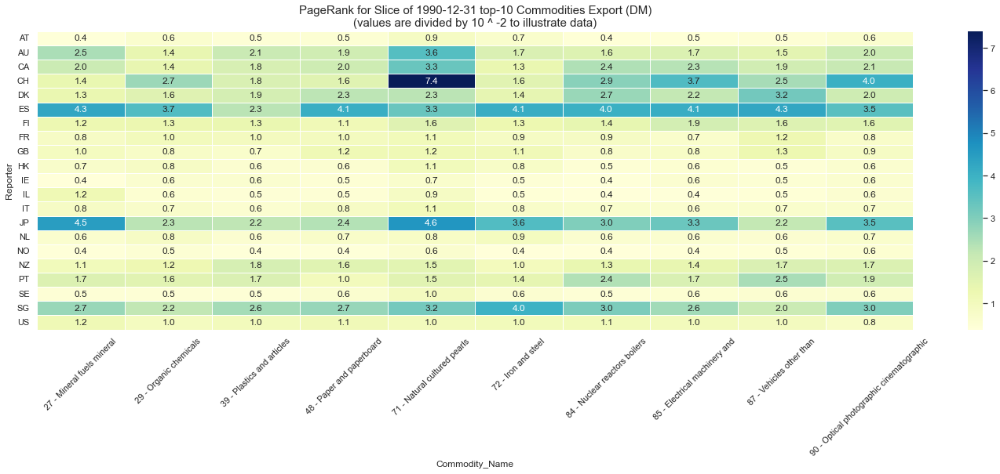

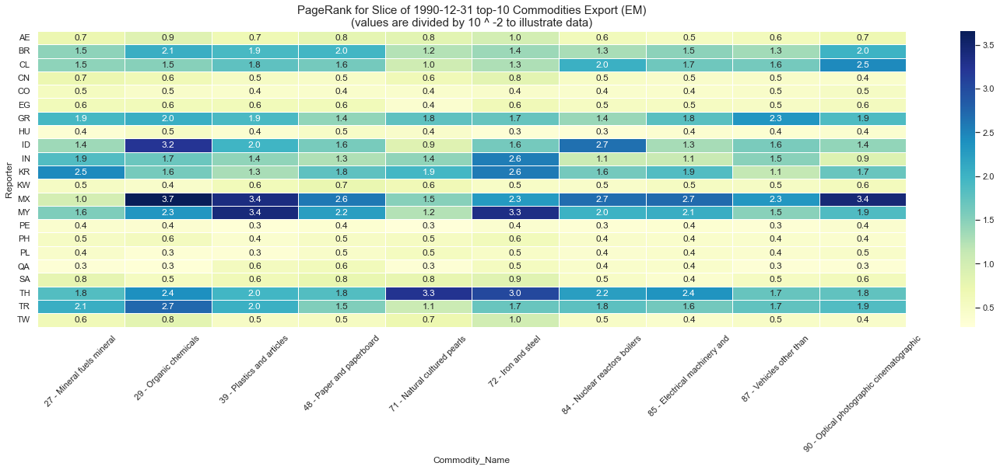

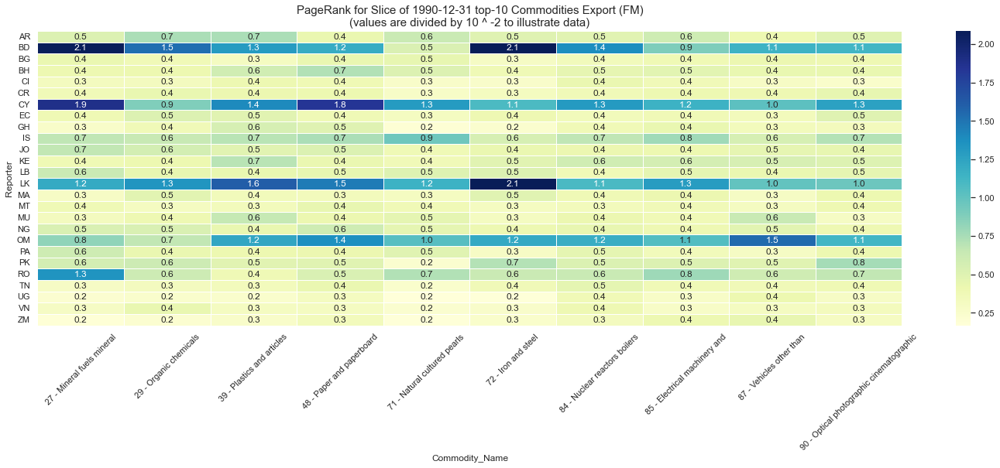

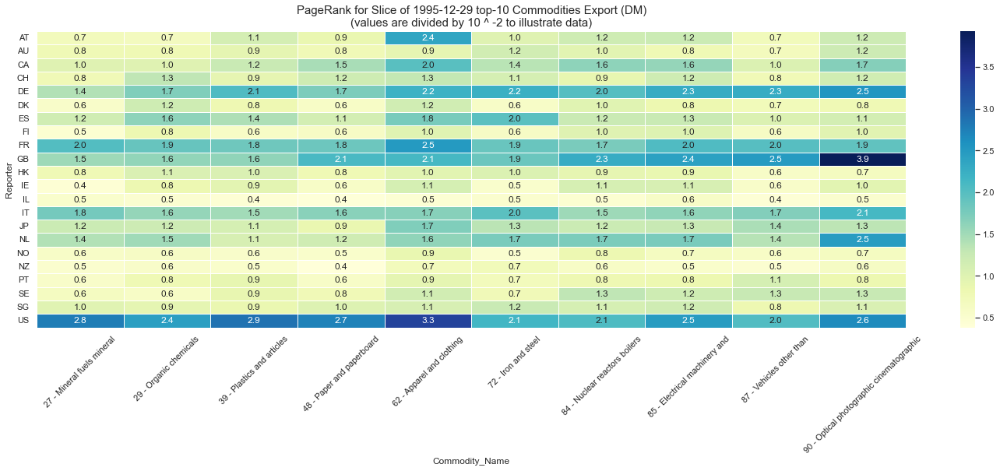

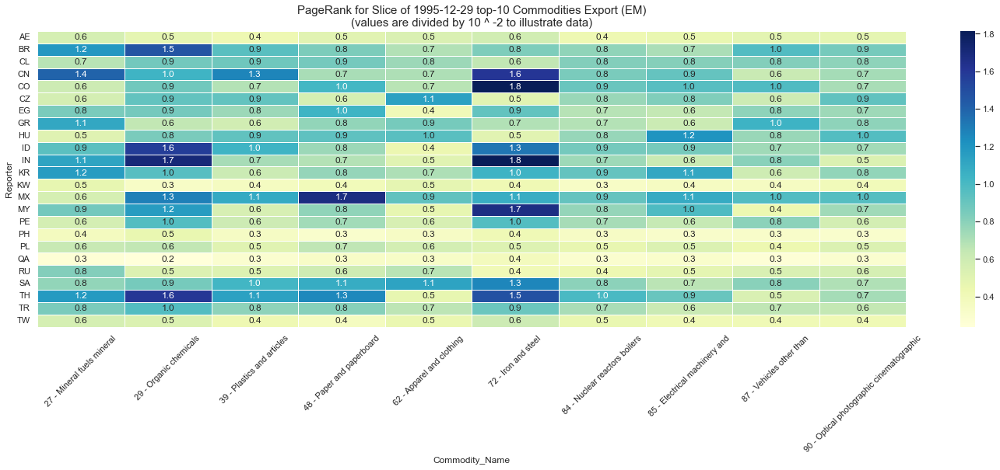

...

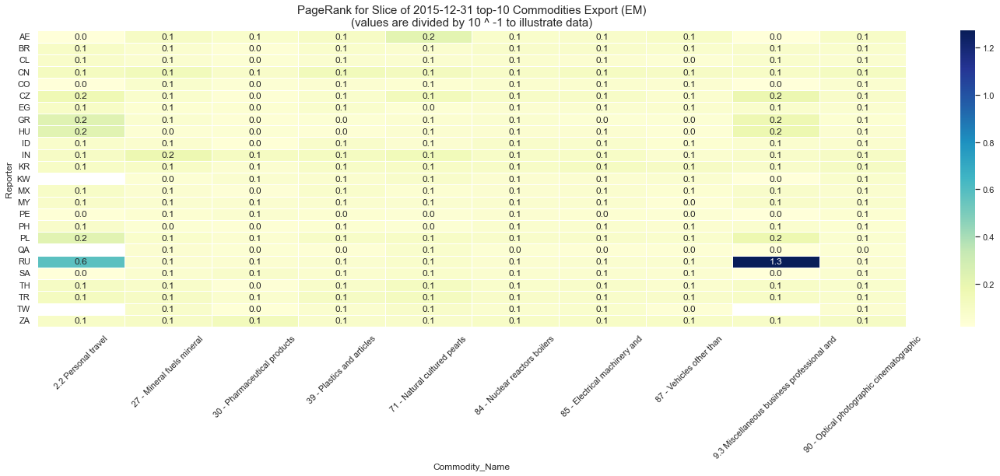

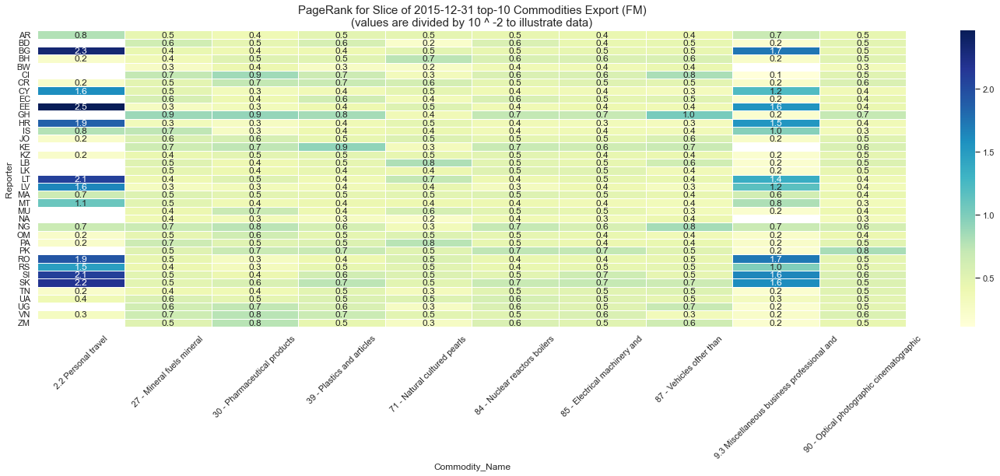

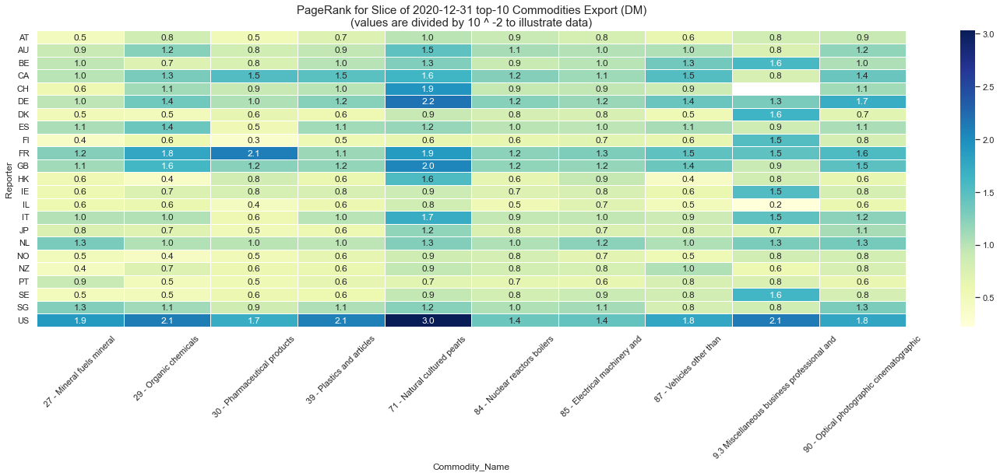

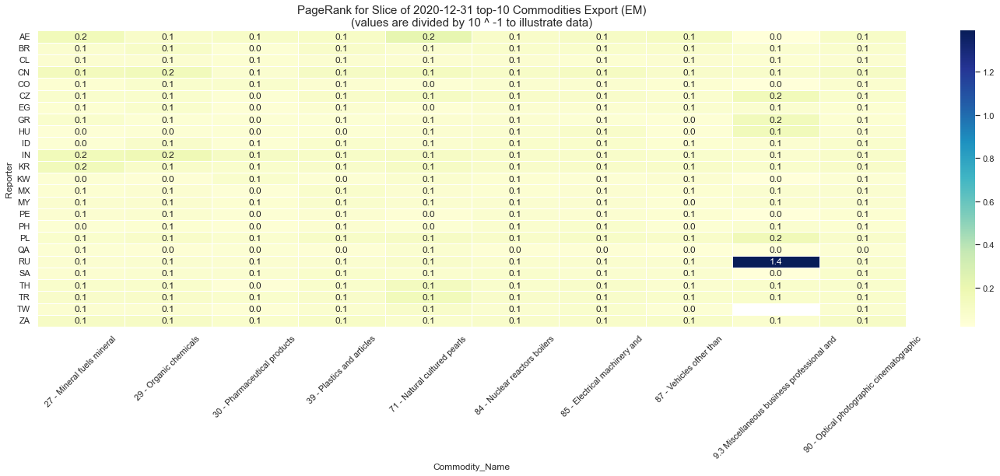

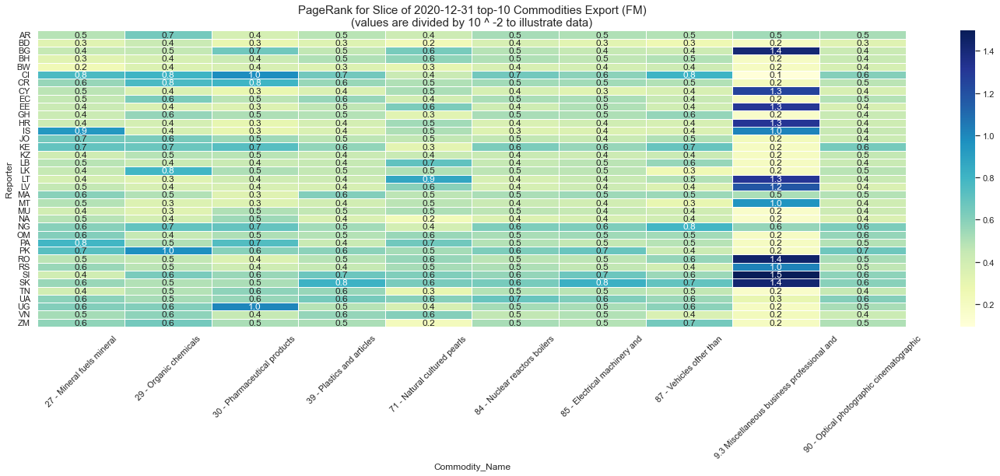

In [18]:
### PAGERANK BY DATE HEATMAP

list_dates = list(pd.date_range('1990', '2021', freq = '5BA-DEC'))

int_top_commodities = 10

ser_ison_status.index.name = 'Reporter'
for iter_date in list_dates:
    ser_iter_popular = ser_country_comm_export[iter_date].groupby('Commodity_ID').sum().nlargest(int_top_commodities)
    ser_iter_pagerank = ser_export_pagerank.loc[[iter_date], ser_ison_status.index, ser_iter_popular.index].droplevel('Date')\
                                           .to_frame().join(ser_ison_status).set_index('Market', append = True).squeeze()
    for iter_region in list_regions:
        ser_iter_date = ser_iter_pagerank.loc[:, :, [iter_region]].droplevel(['Market'])
        df_iter_ag2 = ser_iter_date.loc[:, ser_iter_popular.index].reset_index('Commodity_ID')
        df_iter_ag2['Commodity_Name'] = df_iter_ag2['Commodity_ID'].replace(ser_comm_description).str.replace(';', '').str.replace(',', '')
        df_iter_ag2['Commodity_Name'] = df_iter_ag2['Commodity_Name'].str.split(' ').str[: 5].str.join(' ')
        ser_iter_date = df_iter_ag2.set_index('Commodity_Name', append = True)['PG_Rank_Local']
        df_to_plot = ser_iter_date.unstack('Commodity_Name')
        int_digits = -math.ceil(-np.log10(df_to_plot.max().max()))    
        df_to_plot = (df_to_plot / (10 ** int_digits))  
        ### Heatmap plotting:
        plt.figure(figsize = (25, 7))
        ax_heatmap = sns.heatmap(df_to_plot, cmap = 'YlGnBu', xticklabels = True, yticklabels = True, cbar = True, linewidth = 0.5, square = False,
                                 annot = True, fmt = '0.1f')
        ax_heatmap.set_title('PageRank for Slice of ' + iter_date.strftime(format = '%Y-%m-%d') + ' top-' + str(int_top_commodities) + ' Commodities Export (' + 
                             iter_region + ')\n' + '(values are divided by 10 ^ ' + str(int_digits) + ' to illustrate data)' , fontsize = 15)
        plt.xticks(rotation = 45)
        plt.yticks(rotation = 0)    
        plt.show() 
#        break
#    break            
ser_ison_status.index.name = 'Country'    

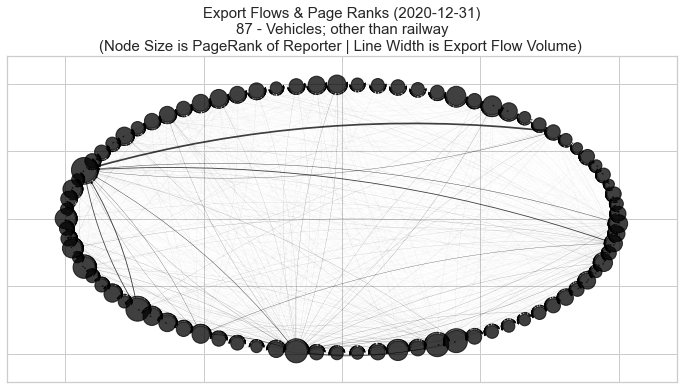

In [22]:
### TEST: PAGERANK VISUALIZATION

gc.collect() 

str_test_comm = '87'
str_test_date = '2020-12-31'
int_top_reporters = 10

ser_test_export = ser_bilateral_export.loc[str_test_date, ser_ison_status.index, ser_ison_status.index, str_test_comm].droplevel(['Date', 'Commodity_ID'])
nx_test_graph = nx.from_pandas_edgelist(ser_test_export.reset_index(), 'Reporter', 'Partner', edge_attr = 'Export', create_using = nx.DiGraph)
ser_test_pagerank = ser_export_pagerank.loc[str_test_date, :, str_test_comm].droplevel(['Date', 'Commodity_ID']).reindex(nx_test_graph.nodes)
list_node_sizes = (0 + ser_test_pagerank / ser_test_pagerank.sum() * 20000).values
list_edge_widths = (ser_test_export.reindex(nx_test_graph.edges) / ser_test_export.sum() * 25).values
plt.figure(figsize = (12, 6))
plt.title('Export Flows & Page Ranks (' + str_test_date + ')' + '\n' + ' '.join(ser_comm_description[str_test_comm].split(' ')[: 6]) + '\n' + 
          '(Node Size is PageRank of Reporter | Line Width is Export Flow Volume) ', fontsize = 15)
nx.draw_networkx(nx_test_graph, pos = nx.shell_layout(nx_test_graph), arrows = True, arrowstyle = '-|>', with_labels = True, font_color = 'white', alpha = 0.75,
                 node_color = 'black', node_size = list_node_sizes, width = list_edge_widths, arrowsize = 5, font_size = 8, connectionstyle = 'arc3, rad = 0.1')
plt.show()  

In [10]:
### TEST: PAGERANK STABILITY TEST (WORLD)

gc.collect()
ser_test_date = '2020-12-31'
ser_bilateral_test = ser_bilateral_export[ser_test_date]
gc.collect()
def get_pagerank(df_group):
    nx_graph = nx.from_pandas_edgelist(df_group, 'Reporter', 'Partner', edge_attr = 'Export', create_using = nx.DiGraph)
    dict_pagerank = nx.pagerank(nx_graph)
    ser_pagerank = pd.Series(dict_pagerank)
    return ser_pagerank
ser_pagerank_world = ser_bilateral_test.reset_index().groupby('Commodity_ID').apply(get_pagerank)
ser_pagerank_world.name = 'PG_Rank_World'
ser_pagerank_world.index.names = ['Commodity_ID', 'Reporter']
ser_pagerank_world = ser_pagerank_world.reorder_levels(['Reporter', 'Commodity_ID']).sort_index()

In [11]:
### TEST: PAGERANK STABILITY TEST (ISON ISOLATED)

gc.collect()
ser_test_date = '2020-12-31'
ser_bilateral_test = ser_bilateral_export.loc[ser_test_date, ser_ison_status.index, ser_ison_status.index, :]
gc.collect()
def get_pagerank(df_group):
    nx_graph = nx.from_pandas_edgelist(df_group, 'Reporter', 'Partner', edge_attr = 'Export', create_using = nx.DiGraph)
    dict_pagerank = nx.pagerank(nx_graph)
    ser_pagerank = pd.Series(dict_pagerank)
    return ser_pagerank
ser_pagerank_ison = ser_bilateral_test.reset_index().groupby('Commodity_ID').apply(get_pagerank)
ser_pagerank_ison.name = 'PG_Rank_ISON'
ser_pagerank_ison.index.names = ['Commodity_ID', 'Reporter']
ser_pagerank_ison = ser_pagerank_ison.reorder_levels(['Reporter', 'Commodity_ID']).sort_index()

In [12]:
### TEST: PAGERANK STABILITY TEST (WITHOUT EXPORT OUTSIDERS)

flo_clip_bound = 0.01
ser_export_share = ser_bilateral_export.loc[ser_test_date].groupby(['Commodity_ID', 'Reporter']).sum()
ser_export_share = (ser_export_share / ser_export_share.groupby('Commodity_ID').sum())
ser_export_cumsum = ser_export_share.groupby('Commodity_ID', group_keys = False).apply(lambda ser_group: ser_group.sort_values().cumsum())
ser_export_leaders = ser_export_share[ser_export_cumsum > flo_clip_bound]

def select_leaders(ser_group):
    str_comm_id = ser_group.index[0][-1]
    idx_leaders = ser_export_leaders.loc[str_comm_id].index
    return ser_group.loc[idx_leaders, idx_leaders]
    
ser_bilateral_test = ser_bilateral_export.loc[ser_test_date].droplevel('Date').groupby('Commodity_ID', group_keys = False).apply(select_leaders)

gc.collect()

def get_pagerank(df_group):
    nx_graph = nx.from_pandas_edgelist(df_group, 'Reporter', 'Partner', edge_attr = 'Export', create_using = nx.DiGraph)
    dict_pagerank = nx.pagerank(nx_graph)
    ser_pagerank = pd.Series(dict_pagerank)
    return ser_pagerank

ser_pagerank_export_leaders_99 = ser_bilateral_test.reset_index().groupby('Commodity_ID').apply(get_pagerank)
ser_pagerank_export_leaders_99.name = 'PG_Rank_Export_Leaders_99'
ser_pagerank_export_leaders_99.index.names = ['Commodity_ID', 'Reporter']
ser_pagerank_export_leaders_99 = ser_pagerank_export_leaders_99.reorder_levels(['Reporter', 'Commodity_ID']).sort_index()

In [13]:
### TEST: PAGERANK STABILITY TEST (WITHOUT EXPORT OUTSIDERS)

flo_clip_bound = 0.05
ser_export_share = ser_bilateral_export.loc[ser_test_date].groupby(['Commodity_ID', 'Reporter']).sum()
ser_export_share = (ser_export_share / ser_export_share.groupby('Commodity_ID').sum())
ser_export_cumsum = ser_export_share.groupby('Commodity_ID', group_keys = False).apply(lambda ser_group: ser_group.sort_values().cumsum())
ser_export_leaders = ser_export_share[ser_export_cumsum > flo_clip_bound]

def select_leaders(ser_group):
    str_comm_id = ser_group.index[0][-1]
    idx_leaders = ser_export_leaders.loc[str_comm_id].index
    return ser_group.loc[idx_leaders, idx_leaders]
    
ser_bilateral_test = ser_bilateral_export.loc[ser_test_date].droplevel('Date').groupby('Commodity_ID', group_keys = False).apply(select_leaders)

gc.collect()

def get_pagerank(df_group):
    nx_graph = nx.from_pandas_edgelist(df_group, 'Reporter', 'Partner', edge_attr = 'Export', create_using = nx.DiGraph)
    dict_pagerank = nx.pagerank(nx_graph)
    ser_pagerank = pd.Series(dict_pagerank)
    return ser_pagerank

ser_pagerank_export_leaders_95 = ser_bilateral_test.reset_index().groupby('Commodity_ID').apply(get_pagerank)
ser_pagerank_export_leaders_95.name = 'PG_Rank_Export_Leaders_95'
ser_pagerank_export_leaders_95.index.names = ['Commodity_ID', 'Reporter']
ser_pagerank_export_leaders_95 = ser_pagerank_export_leaders_95.reorder_levels(['Reporter', 'Commodity_ID']).sort_index()

In [14]:
### TEST: PAGERANK STABILITY TEST (WITHOUT EXPORT OUTSIDERS)

flo_clip_bound = 0.20
ser_export_share = ser_bilateral_export.loc[ser_test_date].groupby(['Commodity_ID', 'Reporter']).sum()
ser_export_share = (ser_export_share / ser_export_share.groupby('Commodity_ID').sum())
ser_export_cumsum = ser_export_share.groupby('Commodity_ID', group_keys = False).apply(lambda ser_group: ser_group.sort_values().cumsum())
ser_export_leaders = ser_export_share[ser_export_cumsum > flo_clip_bound]

def select_leaders(ser_group):
    str_comm_id = ser_group.index[0][-1]
    idx_leaders = ser_export_leaders.loc[str_comm_id].index
    return ser_group.loc[idx_leaders, idx_leaders]
    
ser_bilateral_test = ser_bilateral_export.loc[ser_test_date].droplevel('Date').groupby('Commodity_ID', group_keys = False).apply(select_leaders)

gc.collect()

def get_pagerank(df_group):
    nx_graph = nx.from_pandas_edgelist(df_group, 'Reporter', 'Partner', edge_attr = 'Export', create_using = nx.DiGraph)
    dict_pagerank = nx.pagerank(nx_graph)
    ser_pagerank = pd.Series(dict_pagerank)
    return ser_pagerank

ser_pagerank_export_leaders_80 = ser_bilateral_test.reset_index().groupby('Commodity_ID').apply(get_pagerank)
ser_pagerank_export_leaders_80.name = 'PG_Rank_Export_Leaders_80'
ser_pagerank_export_leaders_80.index.names = ['Commodity_ID', 'Reporter']
ser_pagerank_export_leaders_80 = ser_pagerank_export_leaders_80.reorder_levels(['Reporter', 'Commodity_ID']).sort_index()

In [19]:
### TEST: PAGERANK STABILITY TEST (WITHOUT TRADE OUTSIDERS)

gc.collect()
ser_test_date = '2020-12-31'
flo_clip_bound = 0.01
ser_country_trade_share = pd.concat([ser_bilateral_export.loc[ser_test_date].groupby(['Commodity_ID', 'Reporter']).sum(), 
                                     ser_bilateral_import.loc[ser_test_date].groupby(['Commodity_ID', 'Reporter']).sum()], 
                                    axis = 1, sort = False).fillna(0.0).sum(axis = 1).sort_values()
ser_trade_share = ser_country_trade_share / ser_country_trade_share.groupby('Commodity_ID').sum()
ser_trade_cumsum = ser_trade_share.groupby('Commodity_ID', group_keys = False).apply(lambda ser_group: ser_group.sort_values().cumsum())
ser_trade_leaders = ser_trade_share[ser_trade_cumsum > flo_clip_bound]

def select_leaders(ser_group):
    str_comm_id = ser_group.index[0][-1]
    idx_leaders = ser_trade_leaders.loc[str_comm_id].index
    return ser_group.loc[idx_leaders, idx_leaders]
    
ser_bilateral_test = ser_bilateral_export.loc[ser_test_date].droplevel('Date').groupby('Commodity_ID', group_keys = False).apply(select_leaders)

gc.collect()

def get_pagerank(df_group):
    nx_graph = nx.from_pandas_edgelist(df_group, 'Reporter', 'Partner', edge_attr = 'Export', create_using = nx.DiGraph)
    dict_pagerank = nx.pagerank(nx_graph)
    ser_pagerank = pd.Series(dict_pagerank)
    return ser_pagerank

ser_pagerank_trade_leaders_99 = ser_bilateral_test.reset_index().groupby('Commodity_ID').apply(get_pagerank)
ser_pagerank_trade_leaders_99.name = 'PG_Rank_Trade_Leaders_99'
ser_pagerank_trade_leaders_99.index.names = ['Commodity_ID', 'Reporter']
ser_pagerank_trade_leaders_99 = ser_pagerank_trade_leaders_99.reorder_levels(['Reporter', 'Commodity_ID']).sort_index()

In [20]:
### TEST: PAGERANK STABILITY TEST (WITHOUT TRADE OUTSIDERS)

gc.collect()
ser_test_date = '2020-12-31'
flo_clip_bound = 0.05
ser_country_trade_share = pd.concat([ser_bilateral_export.loc[ser_test_date].groupby(['Commodity_ID', 'Reporter']).sum(), 
                                     ser_bilateral_import.loc[ser_test_date].groupby(['Commodity_ID', 'Reporter']).sum()], 
                                    axis = 1, sort = False).fillna(0.0).sum(axis = 1).sort_values()
ser_trade_share = ser_country_trade_share / ser_country_trade_share.groupby('Commodity_ID').sum()
ser_trade_cumsum = ser_trade_share.groupby('Commodity_ID', group_keys = False).apply(lambda ser_group: ser_group.sort_values().cumsum())
ser_trade_leaders = ser_trade_share[ser_trade_cumsum > flo_clip_bound]

def select_leaders(ser_group):
    str_comm_id = ser_group.index[0][-1]
    idx_leaders = ser_trade_leaders.loc[str_comm_id].index
    return ser_group.loc[idx_leaders, idx_leaders]
    
ser_bilateral_test = ser_bilateral_export.loc[ser_test_date].droplevel('Date').groupby('Commodity_ID', group_keys = False).apply(select_leaders)

gc.collect()

def get_pagerank(df_group):
    nx_graph = nx.from_pandas_edgelist(df_group, 'Reporter', 'Partner', edge_attr = 'Export', create_using = nx.DiGraph)
    dict_pagerank = nx.pagerank(nx_graph)
    ser_pagerank = pd.Series(dict_pagerank)
    return ser_pagerank

ser_pagerank_trade_leaders_95 = ser_bilateral_test.reset_index().groupby('Commodity_ID').apply(get_pagerank)
ser_pagerank_trade_leaders_95.name = 'PG_Rank_Trade_Leaders_95'
ser_pagerank_trade_leaders_95.index.names = ['Commodity_ID', 'Reporter']
ser_pagerank_trade_leaders_95 = ser_pagerank_trade_leaders_95.reorder_levels(['Reporter', 'Commodity_ID']).sort_index()

In [21]:
### TEST: PAGERANK STABILITY TEST (WITHOUT TRADE OUTSIDERS)

gc.collect()
ser_test_date = '2020-12-31'
flo_clip_bound = 0.20
ser_country_trade_share = pd.concat([ser_bilateral_export.loc[ser_test_date].groupby(['Commodity_ID', 'Reporter']).sum(), 
                                     ser_bilateral_import.loc[ser_test_date].groupby(['Commodity_ID', 'Reporter']).sum()], 
                                    axis = 1, sort = False).fillna(0.0).sum(axis = 1).sort_values()
ser_trade_share = ser_country_trade_share / ser_country_trade_share.groupby('Commodity_ID').sum()
ser_trade_cumsum = ser_trade_share.groupby('Commodity_ID', group_keys = False).apply(lambda ser_group: ser_group.sort_values().cumsum())
ser_trade_leaders = ser_trade_share[ser_trade_cumsum > flo_clip_bound]

def select_leaders(ser_group):
    str_comm_id = ser_group.index[0][-1]
    idx_leaders = ser_trade_leaders.loc[str_comm_id].index
    return ser_group.loc[idx_leaders, idx_leaders]
    
ser_bilateral_test = ser_bilateral_export.loc[ser_test_date].droplevel('Date').groupby('Commodity_ID', group_keys = False).apply(select_leaders)

gc.collect()

def get_pagerank(df_group):
    nx_graph = nx.from_pandas_edgelist(df_group, 'Reporter', 'Partner', edge_attr = 'Export', create_using = nx.DiGraph)
    dict_pagerank = nx.pagerank(nx_graph)
    ser_pagerank = pd.Series(dict_pagerank)
    return ser_pagerank

ser_pagerank_trade_leaders_80 = ser_bilateral_test.reset_index().groupby('Commodity_ID').apply(get_pagerank)
ser_pagerank_trade_leaders_80.name = 'PG_Rank_Trade_Leaders_80'
ser_pagerank_trade_leaders_80.index.names = ['Commodity_ID', 'Reporter']
ser_pagerank_trade_leaders_80 = ser_pagerank_trade_leaders_80.reorder_levels(['Reporter', 'Commodity_ID']).sort_index()

In [87]:
### TEST: PAGERANK STABILITY TEST (CORRELATIONS)

gc.collect()
df_pagerank_test = pd.concat([ser_pagerank_ison, ser_pagerank_world, ser_pagerank_export_leaders_99, ser_pagerank_export_leaders_95, ser_pagerank_export_leaders_80, 
                              ser_pagerank_trade_leaders_99, ser_pagerank_trade_leaders_95, ser_pagerank_trade_leaders_80], axis = 1)
df_pagerank_corr_full = df_pagerank_test.groupby('Commodity_ID').corr()
df_pagerank_corr = pd.DataFrame()
df_pagerank_corr['Top_99_Exporters_to_World'] = df_pagerank_corr_full.loc[(All, 'PG_Rank_Export_Leaders_99'), 'PG_Rank_World'].droplevel(-1).squeeze()
df_pagerank_corr['Top_95_Exporters_to_World'] = df_pagerank_corr_full.loc[(All, 'PG_Rank_Export_Leaders_95'), 'PG_Rank_World'].droplevel(-1).squeeze()
df_pagerank_corr['Top_80_Exporters_to_World'] = df_pagerank_corr_full.loc[(All, 'PG_Rank_Export_Leaders_80'), 'PG_Rank_World'].droplevel(-1).squeeze()
df_pagerank_corr['Top_99_Traders_to_World'] = df_pagerank_corr_full.loc[(All, 'PG_Rank_Trade_Leaders_99'), 'PG_Rank_World'].droplevel(-1).squeeze()
df_pagerank_corr['Top_95_Traders_to_World'] = df_pagerank_corr_full.loc[(All, 'PG_Rank_Trade_Leaders_95'), 'PG_Rank_World'].droplevel(-1).squeeze()
df_pagerank_corr['Top_80_Traders_to_World'] = df_pagerank_corr_full.loc[(All, 'PG_Rank_Trade_Leaders_80'), 'PG_Rank_World'].droplevel(-1).squeeze()
df_pagerank_corr['ISON_to_World'] = df_pagerank_corr_full.loc[(All, 'PG_Rank_ISON'), 'PG_Rank_World'].droplevel(-1).squeeze()
#df_pagerank_corr['Top_Exporters_to_World'] = df_pagerank_corr_full.loc[(All, 'PG_Rank_Export_Leaders'), 'PG_Rank_World'].droplevel(-1).squeeze()
#df_pagerank_corr['Top_Traders_to_World'] = df_pagerank_corr_full.loc[(All, 'PG_Rank_Trade_Leaders'), 'PG_Rank_World'].droplevel(-1).squeeze()

In [ ]:
### TEST: PAGERANK STABILITY TEST (WITHOUT TOPS)

gc.collect()
ser_test_date = '2020-12-31'
list_world = sorted(ser_bilateral_export.loc[ser_test_date].index.get_level_values('Reporter').unique().to_list())
int_attempts_number = 100
int_sample_length = 10
def get_pagerank(df_group):
    nx_graph = nx.from_pandas_edgelist(df_group, 'Reporter', 'Partner', edge_attr = 'Export', create_using = nx.DiGraph)
    dict_pagerank = nx.pagerank(nx_graph)
    ser_pagerank = pd.Series(dict_pagerank)
    return ser_pagerank
list_correlations = []
for iter_num in range(int_attempts_number):
    gc.collect()
    list_to_drop = random.sample(list_world, int_sample_length)
    print(iter_num, ':', list_to_drop)
    ser_bilateral_test = ser_bilateral_export.loc[ser_test_date].drop(list_to_drop, level = 'Reporter').drop(list_to_drop, level = 'Partner')
    ser_iter_pagerank = ser_bilateral_test.reset_index().groupby(['Date', 'Commodity_ID']).apply(get_pagerank).droplevel('Date')
    ser_iter_pagerank.name = 'PG_Rank_random_dropped'
    ser_iter_pagerank.index.names = ['Commodity_ID', 'Reporter']
    ser_iter_pagerank = ser_iter_pagerank.reorder_levels(['Reporter', 'Commodity_ID']).sort_index()
    df_iter_pagerank = pd.concat([ser_pagerank_world, ser_iter_pagerank], axis = 1)
    list_correlations.append(df_iter_pagerank.groupby('Commodity_ID').corr().loc[(All, 'PG_Rank_World'), 'PG_Rank_random_dropped'].droplevel(-1))
#    break
df_pagerank_corr['Random_' + str(int_sample_length) + '_Dropped'] = pd.concat(list_correlations, axis = 1).mean(axis = 1)

In [ ]:
### TEST: PAGERANK STABILITY TEST (WITHOUT TOPS)

gc.collect()
ser_test_date = '2020-12-31'
list_world = sorted(ser_bilateral_export.loc[ser_test_date].index.get_level_values('Reporter').unique().to_list())
int_attempts_number = 100
int_sample_length = 50
def get_pagerank(df_group):
    nx_graph = nx.from_pandas_edgelist(df_group, 'Reporter', 'Partner', edge_attr = 'Export', create_using = nx.DiGraph)
    dict_pagerank = nx.pagerank(nx_graph)
    ser_pagerank = pd.Series(dict_pagerank)
    return ser_pagerank
list_correlations = []
for iter_num in range(int_attempts_number):
    gc.collect()
    list_to_drop = random.sample(list_world, int_sample_length)
    print(iter_num, ':', list_to_drop)
    ser_bilateral_test = ser_bilateral_export.loc[ser_test_date].drop(list_to_drop, level = 'Reporter').drop(list_to_drop, level = 'Partner')
    ser_iter_pagerank = ser_bilateral_test.reset_index().groupby(['Date', 'Commodity_ID']).apply(get_pagerank).droplevel('Date')
    ser_iter_pagerank.name = 'PG_Rank_random_dropped'
    ser_iter_pagerank.index.names = ['Commodity_ID', 'Reporter']
    ser_iter_pagerank = ser_iter_pagerank.reorder_levels(['Reporter', 'Commodity_ID']).sort_index()
    df_iter_pagerank = pd.concat([ser_pagerank_world, ser_iter_pagerank], axis = 1)
    list_correlations.append(df_iter_pagerank.groupby('Commodity_ID').corr().loc[(All, 'PG_Rank_World'), 'PG_Rank_random_dropped'].droplevel(-1))
#    break
df_pagerank_corr['Random_' + str(int_sample_length) + '_Dropped'] = pd.concat(list_correlations, axis = 1).mean(axis = 1)

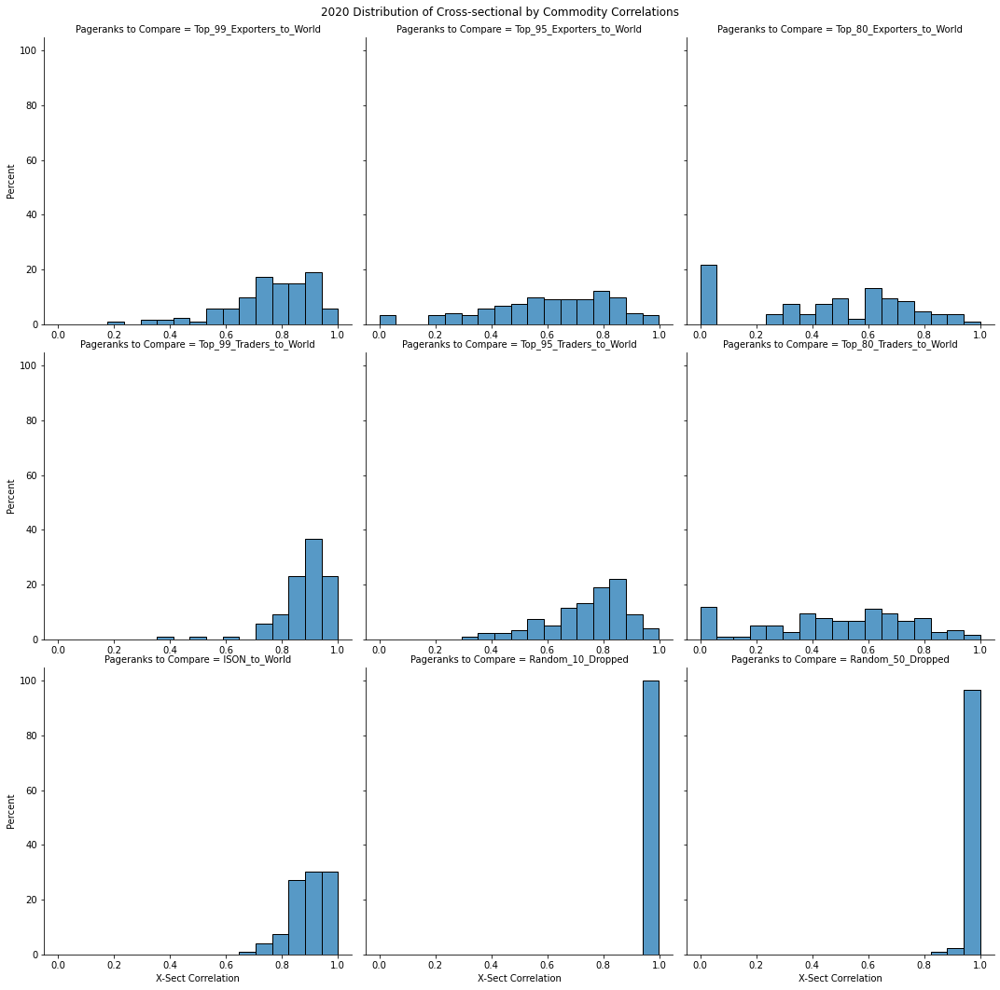

In [95]:
### TEST: PAGERANK STABILITY TEST (VISUALIZATION)

ser_pagerank_corr = df_pagerank_corr.stack()
ser_pagerank_corr.index.names = ['Commodity_ID', 'Pageranks to Compare']
ser_pagerank_corr.name = 'X-Sect Correlation'
df_to_plot = ser_pagerank_corr.reset_index()
facetgrid_corr = sns.displot(data = df_to_plot, x = 'X-Sect Correlation', col = 'Pageranks to Compare', col_wrap = 3, stat = 'percent', common_norm = False)
facetgrid_corr.fig.subplots_adjust(top = 0.95)
facetgrid_corr.fig.suptitle('2020 Distribution of Cross-sectional by Commodity Correlations')
for iter_ax in facetgrid_corr.axes.flatten():
    iter_ax.tick_params(labelbottom = True)
plt.show()

In [24]:
### LOADING COMMODITIES TO INDUSTRIES MAP

df_goods_to_ind = pd.read_excel(engine = 'openpyxl', io = str_path_industry_map_xlsx, sheet_name = str_page_goods, header = 0, dtype = 'object',
                                na_values = list_na_excel_values, keep_default_na = False).set_index('Commodity ID')
df_goods_to_ind.index.names = ['Commodity_ID']
ser_goods_to_ind = df_goods_to_ind.dropna()['GICS Industry Group'].squeeze()
ser_goods_to_ind.name = 'Industry_Group'
df_services_to_ind = pd.read_excel(engine = 'openpyxl', io = str_path_industry_map_xlsx, sheet_name = str_page_services, header = 0, dtype = 'object',
                                na_values = list_na_excel_values, keep_default_na = False).set_index('Service ID')
df_services_to_ind.index.names = ['Commodity_ID']
ser_comm_description = pd.concat([df_goods_to_ind['AG2'], df_services_to_ind.loc[list_services, 'Service Description']], axis = 0)
ser_comm_description.name = 'Description'

In [25]:
### TEST: PAGERANK STABILITY TEST (LOWEST CORRELATIONS)

for iter_col in df_pagerank_corr.columns:
    print('Lowest correlations:', iter_col)
    display(df_pagerank_corr[[iter_col]].join(ser_comm_description).set_index('Description').squeeze().nsmallest())

Lowest correlations: Top_99_Exporters_to_World


Description
84 - Nuclear reactors, boilers, machinery and mechanical appliances; parts thereof                                                                                                                                         0.196128
85 - Electrical machinery and equipment and parts thereof; sound recorders and reproducers; television image and sound recorders and reproducers, parts and accessories of such articles                                   0.333995
95 - Toys, games and sports requisites; parts and accessories thereof                                                                                                                                                      0.346216
94 - Furniture; bedding, mattresses, mattress supports, cushions and similar stuffed furnishings; lamps and lighting fittings, n.e.s.; illuminated signs, illuminated name-plates and the like; prefabricated buildings    0.386644
90 - Optical, photographic, cinematographic, measuring, checking, medical or

Lowest correlations: Top_95_Exporters_to_World


Description
87 - Vehicles; other than railway or tramway rolling stock, and parts and accessories thereof    -1.003064e-16
30 - Pharmaceutical products                                                                      2.380798e-16
37 - Photographic or cinematographic goods                                                        3.261847e-16
82 - Tools, implements, cutlery, spoons and forks, of base metal; parts thereof, of base metal    4.837407e-16
38 - Chemical products n.e.s.                                                                     1.968738e-01
Name: Top_95_Exporters_to_World, dtype: float64

Lowest correlations: Top_80_Exporters_to_World


Description
48 - Paper and paperboard; articles of paper pulp, of paper or paperboard                                                                -4.924912e-16
90 - Optical, photographic, cinematographic, measuring, checking, medical or surgical instruments and apparatus; parts and accessories   -3.455725e-16
30 - Pharmaceutical products                                                                                                             -3.062568e-16
33 - Essential oils and resinoids; perfumery, cosmetic or toilet preparations                                                            -2.981314e-16
96 - Miscellaneous manufactured articles                                                                                                 -2.952951e-16
Name: Top_80_Exporters_to_World, dtype: float64

Lowest correlations: Top_99_Traders_to_World


Description
36 - Explosives; pyrotechnic products; matches; pyrophoric alloys; certain combustible preparations    0.357209
9.3 Miscellaneous business, professional, and technical services                                       0.524412
3.2 Telecommunications services                                                                        0.624279
75 - Nickel and articles thereof                                                                       0.708298
30 - Pharmaceutical products                                                                           0.712930
Name: Top_99_Traders_to_World, dtype: float64

Lowest correlations: Top_95_Traders_to_World


Description
85 - Electrical machinery and equipment and parts thereof; sound recorders and reproducers; television image and sound recorders and reproducers, parts and accessories of such articles    0.311810
9.3 Miscellaneous business, professional, and technical services                                                                                                                            0.364650
39 - Plastics and articles thereof                                                                                                                                                          0.410737
95 - Toys, games and sports requisites; parts and accessories thereof                                                                                                                       0.411532
90 - Optical, photographic, cinematographic, measuring, checking, medical or surgical instruments and apparatus; parts and accessories                                                      0.420510
Nam

Lowest correlations: Top_80_Traders_to_World


Description
33 - Essential oils and resinoids; perfumery, cosmetic or toilet preparations                                                                                                                                             -5.949954e-16
94 - Furniture; bedding, mattresses, mattress supports, cushions and similar stuffed furnishings; lamps and lighting fittings, n.e.s.; illuminated signs, illuminated name-plates and the like; prefabricated buildings   -4.175034e-16
97 - Works of art; collectors' pieces and antiques                                                                                                                                                                        -9.169975e-17
83 - Metal; miscellaneous products of base metal                                                                                                                                                                          -8.248696e-17
95 - Toys, games and sports requisites; parts and accessorie

Lowest correlations: ISON_to_World


Description
35 - Albuminoidal substances; modified starches; glues; enzymes                                        0.681476
36 - Explosives; pyrotechnic products; matches; pyrophoric alloys; certain combustible preparations    0.712012
19 - Preparations of cereals, flour, starch or milk; pastrycooks' products                             0.721569
31 - Fertilizers                                                                                       0.742068
30 - Pharmaceutical products                                                                           0.761241
Name: ISON_to_World, dtype: float64

In [45]:
### TEMP

ser_test = ser_country_trade_share['78']
ser_test = ser_test.sort_values() / ser_test.sum()
len(ser_test[ser_test.cumsum() > 0.01])

86

In [109]:
### TEST: WEIGHTED AVERAGE OF CORRELATIONS (COUNTRY BASED WEIGHTS)

df_country_corr = pd.DataFrame()
df_corr_to_weight = ser_country_comm_export['2020-12-31'].to_frame().join(df_pagerank_corr)

for iter_col in df_corr_to_weight.columns[1 :]:
    df_country_corr[iter_col] = df_corr_to_weight[['Export', iter_col]].groupby('Reporter')\
                                                    .apply(lambda df_group: weighted_average(df_group[iter_col], df_group['Export'] / 1000))[ser_ison_status.index]
    
df_country_corr = df_country_corr.join(ser_ison_status).set_index('Market', append = True)

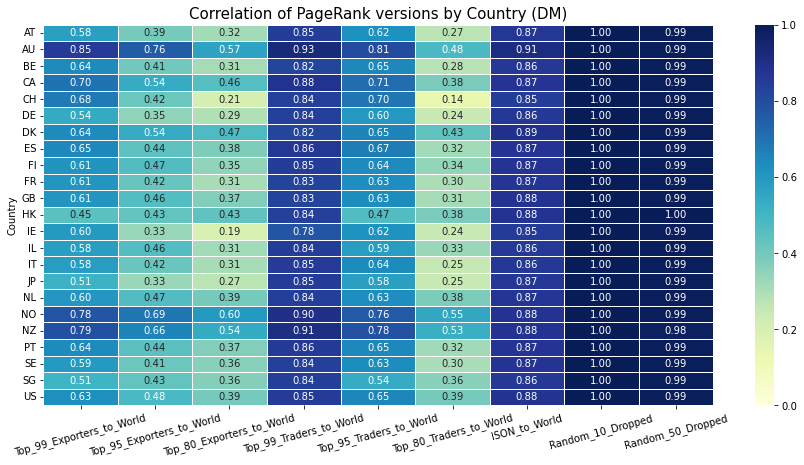

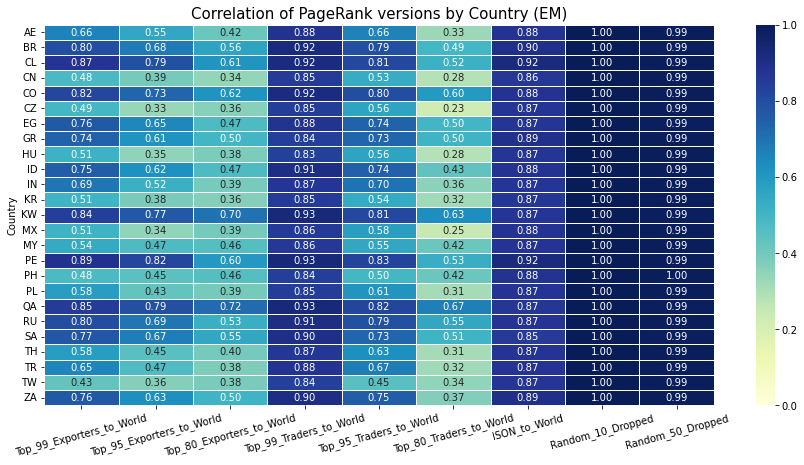

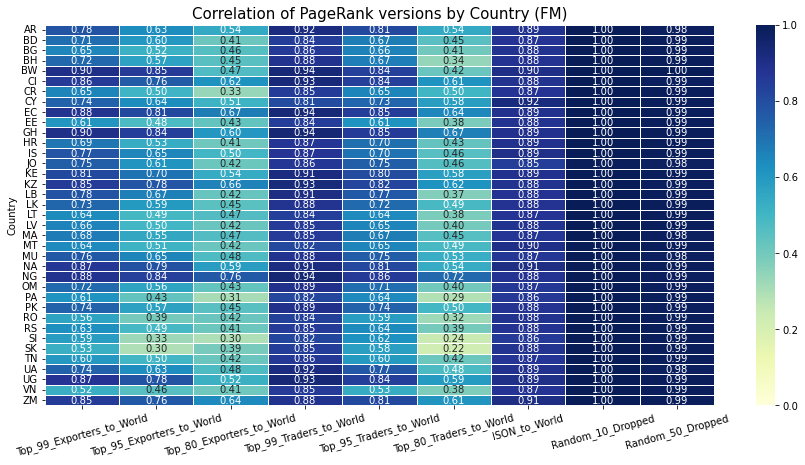

In [110]:
### TEST: WEIGHTED AVERAGE OF CORRELATIONS (COUNTRY BASED WEIGHTS)

### By Region Visualization:
for iter_region in list_regions:
    df_to_plot = df_country_corr.loc[(All, iter_region), :].droplevel(['Market'])
    ### Heatmap plotting:
    plt.figure(figsize = (15, 7))
    ax_heatmap = sns.heatmap(df_to_plot, cmap = 'YlGnBu', xticklabels = True, yticklabels = True, cbar = True, linewidth = 0.5, square = False, annot = True, 
                             fmt = '0.2f', vmin = 0, vmax = 1)
    ax_heatmap.set_title('Correlation of PageRank versions by Country (' + iter_region + ')', fontsize = 15)
    plt.yticks(rotation = 0)
    plt.xticks(rotation = 15)
    plt.show()     
#    break